In [1]:
# ============================================================
# 1. PlantVillage 38클래스 중 클래스별 30%만 전처리해서
#    별도 디렉토리에 저장하는 코드
# ============================================================

import os
import cv2
import shutil
import random
from pathlib import Path
from tqdm import tqdm

# 원본 PlantVillage 38클래스 경로
ORIGINAL_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"
VALID_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"
# 30% 전처리 이미지만 저장할 경로
SAVE_PREP_DIR = "/home/harry/Re_leaf_Project/Plant_preprocessed_30per_only"

PREPROCESS_RATIO = 0.30
SEED = 42

random.seed(SEED)

# 이미지 확장자
IMG_EXTS = [".jpg", ".jpeg", ".png", ".bmp", ".webp"]


def is_image_file(filename):
    return Path(filename).suffix.lower() in IMG_EXTS


def preprocess_image(img):
    """
    형이 기존에 쓰던 전처리 방식 있으면
    이 함수 안쪽만 교체하면 됨.
    일단 기본 예시는 CLAHE + 약한 샤프닝 기준.
    """

    # BGR -> LAB 변환
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    l, a, b = cv2.split(lab)

    # CLAHE로 명암 대비 강화
    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )
    l_clahe = clahe.apply(l)

    lab_clahe = cv2.merge((l_clahe, a, b))
    enhanced = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

    # 약한 샤프닝
    blur = cv2.GaussianBlur(enhanced, (0, 0), 1.0)
    sharpened = cv2.addWeighted(enhanced, 1.3, blur, -0.3, 0)

    return sharpened


def make_preprocessed_subset():
    original_root = Path(ORIGINAL_DIR)
    save_root = Path(SAVE_PREP_DIR)

    save_root.mkdir(parents=True, exist_ok=True)

    class_dirs = sorted([
        d for d in original_root.iterdir()
        if d.is_dir()
    ])

    print(f"클래스 수: {len(class_dirs)}")
    print(f"저장 경로: {save_root}")

    total_selected = 0

    for class_dir in class_dirs:
        class_name = class_dir.name
        save_class_dir = save_root / class_name
        save_class_dir.mkdir(parents=True, exist_ok=True)

        image_files = sorted([
            f for f in class_dir.iterdir()
            if f.is_file() and is_image_file(f.name)
        ])

        select_count = int(len(image_files) * PREPROCESS_RATIO)

        selected_files = random.sample(image_files, select_count)

        print(f"{class_name}: 전체 {len(image_files)}장 중 {select_count}장 전처리")

        for img_path in tqdm(selected_files, desc=class_name):
            img = cv2.imread(str(img_path))

            if img is None:
                print(f"이미지 읽기 실패: {img_path}")
                continue

            prep_img = preprocess_image(img)

            save_name = img_path.stem + "_prep.jpg"
            save_path = save_class_dir / save_name

            cv2.imwrite(str(save_path), prep_img)

        total_selected += select_count

    print("전처리 30% 데이터셋 생성 완료")
    print(f"총 전처리 이미지 수: {total_selected}")


make_preprocessed_subset()

클래스 수: 38
저장 경로: /home/harry/Re_leaf_Project/Plant_preprocessed_30per_only
Apple___Apple_scab: 전체 2016장 중 604장 전처리


Apple___Apple_scab: 100%|████████████████████████████████████████████████████████████| 604/604 [00:00<00:00, 744.81it/s]


Apple___Black_rot: 전체 1987장 중 596장 전처리


Apple___Black_rot: 100%|█████████████████████████████████████████████████████████████| 596/596 [00:00<00:00, 795.61it/s]


Apple___Cedar_apple_rust: 전체 1760장 중 528장 전처리


Apple___Cedar_apple_rust: 100%|██████████████████████████████████████████████████████| 528/528 [00:00<00:00, 883.60it/s]


Apple___healthy: 전체 2008장 중 602장 전처리


Apple___healthy: 100%|███████████████████████████████████████████████████████████████| 602/602 [00:00<00:00, 839.73it/s]


Blueberry___healthy: 전체 1816장 중 544장 전처리


Blueberry___healthy: 100%|███████████████████████████████████████████████████████████| 544/544 [00:00<00:00, 810.77it/s]


Cherry_(including_sour)___Powdery_mildew: 전체 1683장 중 504장 전처리


Cherry_(including_sour)___Powdery_mildew: 100%|██████████████████████████████████████| 504/504 [00:00<00:00, 840.16it/s]


Cherry_(including_sour)___healthy: 전체 1826장 중 547장 전처리


Cherry_(including_sour)___healthy: 100%|█████████████████████████████████████████████| 547/547 [00:00<00:00, 776.71it/s]


Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 전체 1642장 중 492장 전처리


Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 100%|████████████████████████████| 492/492 [00:00<00:00, 793.18it/s]


Corn_(maize)___Common_rust_: 전체 1907장 중 572장 전처리


Corn_(maize)___Common_rust_: 100%|███████████████████████████████████████████████████| 572/572 [00:00<00:00, 821.01it/s]


Corn_(maize)___Northern_Leaf_Blight: 전체 1908장 중 572장 전처리


Corn_(maize)___Northern_Leaf_Blight: 100%|███████████████████████████████████████████| 572/572 [00:00<00:00, 791.62it/s]


Corn_(maize)___healthy: 전체 1859장 중 557장 전처리


Corn_(maize)___healthy: 100%|████████████████████████████████████████████████████████| 557/557 [00:00<00:00, 840.03it/s]


Grape___Black_rot: 전체 1888장 중 566장 전처리


Grape___Black_rot: 100%|█████████████████████████████████████████████████████████████| 566/566 [00:00<00:00, 799.15it/s]


Grape___Esca_(Black_Measles): 전체 1920장 중 576장 전처리


Grape___Esca_(Black_Measles): 100%|██████████████████████████████████████████████████| 576/576 [00:00<00:00, 768.88it/s]


Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 전체 1722장 중 516장 전처리


Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 100%|████████████████████████████████████| 516/516 [00:00<00:00, 756.50it/s]


Grape___healthy: 전체 1692장 중 507장 전처리


Grape___healthy: 100%|███████████████████████████████████████████████████████████████| 507/507 [00:00<00:00, 806.43it/s]


Orange___Haunglongbing_(Citrus_greening): 전체 2010장 중 603장 전처리


Orange___Haunglongbing_(Citrus_greening): 100%|██████████████████████████████████████| 603/603 [00:00<00:00, 852.45it/s]


Peach___Bacterial_spot: 전체 1838장 중 551장 전처리


Peach___Bacterial_spot: 100%|████████████████████████████████████████████████████████| 551/551 [00:00<00:00, 833.04it/s]


Peach___healthy: 전체 1728장 중 518장 전처리


Peach___healthy: 100%|███████████████████████████████████████████████████████████████| 518/518 [00:00<00:00, 803.32it/s]


Pepper,_bell___Bacterial_spot: 전체 1913장 중 573장 전처리


Pepper,_bell___Bacterial_spot: 100%|█████████████████████████████████████████████████| 573/573 [00:00<00:00, 772.22it/s]


Pepper,_bell___healthy: 전체 1988장 중 596장 전처리


Pepper,_bell___healthy: 100%|████████████████████████████████████████████████████████| 596/596 [00:00<00:00, 783.53it/s]


Potato___Early_blight: 전체 1939장 중 581장 전처리


Potato___Early_blight: 100%|█████████████████████████████████████████████████████████| 581/581 [00:00<00:00, 761.06it/s]


Potato___Late_blight: 전체 1939장 중 581장 전처리


Potato___Late_blight: 100%|██████████████████████████████████████████████████████████| 581/581 [00:00<00:00, 789.27it/s]


Potato___healthy: 전체 1824장 중 547장 전처리


Potato___healthy: 100%|██████████████████████████████████████████████████████████████| 547/547 [00:00<00:00, 768.52it/s]


Raspberry___healthy: 전체 1781장 중 534장 전처리


Raspberry___healthy: 100%|███████████████████████████████████████████████████████████| 534/534 [00:00<00:00, 787.71it/s]


Soybean___healthy: 전체 2022장 중 606장 전처리


Soybean___healthy: 100%|█████████████████████████████████████████████████████████████| 606/606 [00:00<00:00, 791.52it/s]


Squash___Powdery_mildew: 전체 1736장 중 520장 전처리


Squash___Powdery_mildew: 100%|███████████████████████████████████████████████████████| 520/520 [00:03<00:00, 144.26it/s]


Strawberry___Leaf_scorch: 전체 1774장 중 532장 전처리


Strawberry___Leaf_scorch: 100%|██████████████████████████████████████████████████████| 532/532 [00:00<00:00, 765.72it/s]


Strawberry___healthy: 전체 1824장 중 547장 전처리


Strawberry___healthy: 100%|██████████████████████████████████████████████████████████| 547/547 [00:00<00:00, 764.57it/s]


Tomato___Bacterial_spot: 전체 1702장 중 510장 전처리


Tomato___Bacterial_spot: 100%|███████████████████████████████████████████████████████| 510/510 [00:00<00:00, 839.14it/s]


Tomato___Early_blight: 전체 1920장 중 576장 전처리


Tomato___Early_blight: 100%|█████████████████████████████████████████████████████████| 576/576 [00:00<00:00, 816.16it/s]


Tomato___Late_blight: 전체 1851장 중 555장 전처리


Tomato___Late_blight: 100%|██████████████████████████████████████████████████████████| 555/555 [00:00<00:00, 824.50it/s]


Tomato___Leaf_Mold: 전체 1882장 중 564장 전처리


Tomato___Leaf_Mold: 100%|████████████████████████████████████████████████████████████| 564/564 [00:00<00:00, 809.95it/s]


Tomato___Septoria_leaf_spot: 전체 1745장 중 523장 전처리


Tomato___Septoria_leaf_spot: 100%|███████████████████████████████████████████████████| 523/523 [00:00<00:00, 784.19it/s]


Tomato___Spider_mites Two-spotted_spider_mite: 전체 1741장 중 522장 전처리


Tomato___Spider_mites Two-spotted_spider_mite: 100%|█████████████████████████████████| 522/522 [00:00<00:00, 763.76it/s]


Tomato___Target_Spot: 전체 1827장 중 548장 전처리


Tomato___Target_Spot: 100%|██████████████████████████████████████████████████████████| 548/548 [00:00<00:00, 752.80it/s]


Tomato___Tomato_Yellow_Leaf_Curl_Virus: 전체 1961장 중 588장 전처리


Tomato___Tomato_Yellow_Leaf_Curl_Virus: 100%|████████████████████████████████████████| 588/588 [00:00<00:00, 842.39it/s]


Tomato___Tomato_mosaic_virus: 전체 1790장 중 537장 전처리


Tomato___Tomato_mosaic_virus: 100%|██████████████████████████████████████████████████| 537/537 [00:00<00:00, 785.37it/s]


Tomato___healthy: 전체 1926장 중 577장 전처리


Tomato___healthy: 100%|██████████████████████████████████████████████████████████████| 577/577 [00:00<00:00, 747.68it/s]

전처리 30% 데이터셋 생성 완료
총 전처리 이미지 수: 21072


In [3]:
# ============================================================
# 38realmix 모델을 베이스로
# 전처리 30% 이미지만 추가학습하는 코드
# 검증은 기존 원본 valid 데이터셋 사용
# ============================================================

import os
import json
import torch
import random
import numpy as np
import torch.nn as nn
import torch.optim as optim

from tqdm import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader


# ============================================================
# 기본 설정
# ============================================================

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 전처리 30% 이미지만 들어있는 추가학습용 데이터
TRAIN_DIR = "/home/harry/Re_leaf_Project/Plant_preprocessed_30per_only"

# 기존 원본 validation 데이터
VALID_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

# 기존에 학습 완료된 38realmix 모델
BASE_MODEL_PATH = "model_convnext_tiny_38cls_realmix_finetuned.pth"

# 저장 이름
SAVE_CP_PATH = "cp_convnext_tiny_38realmix_pvprep30_finetuned.pth"
SAVE_MODEL_PATH = "model_convnext_tiny_38realmix_pvprep30_finetuned.pth"

CLASS_NAMES_PATH = "class_names_38.json"

IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 10
LR = 1e-5
SEED = 42
NUM_CLASSES = 38


# ============================================================
# seed 고정
# ============================================================

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)


set_seed(SEED)


# ============================================================
# transform
# ============================================================

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================================
# Dataset 준비
# ============================================================

train_dataset = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    root=VALID_DIR,
    transform=val_transform
)

# train / valid 클래스 이름과 순서가 같은지 확인
assert train_dataset.classes == val_dataset.classes, \
    "train_dataset과 val_dataset의 클래스 이름 또는 순서가 다릅니다."

class_names = train_dataset.classes

print("클래스 수:", len(class_names))
print("추가학습 train 이미지 수:", len(train_dataset))
print("원본 valid 이미지 수:", len(val_dataset))

# class_names 저장
with open(CLASS_NAMES_PATH, "w", encoding="utf-8") as f:
    json.dump(class_names, f, ensure_ascii=False, indent=4)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)


# ============================================================
# ConvNeXt Tiny 모델 생성
# ============================================================

model = models.convnext_tiny(weights=None)

# classifier 수정
in_features = model.classifier[2].in_features
model.classifier[2] = nn.Linear(in_features, NUM_CLASSES)

# 기존 38realmix 모델 weight 불러오기
state_dict = torch.load(BASE_MODEL_PATH, map_location=DEVICE)
model.load_state_dict(state_dict)

model = model.to(DEVICE)

print("베이스 모델 로드 완료:", BASE_MODEL_PATH)


# ============================================================
# Loss, Optimizer
# ============================================================

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    model.parameters(),
    lr=LR,
    weight_decay=1e-4
)


# ============================================================
# 학습 함수
# ============================================================

def train_one_epoch(model, loader, criterion, optimizer):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Train"):
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


# ============================================================
# 검증 함수
# ============================================================

def validate(model, loader, criterion):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Valid"):
            images = images.to(DEVICE)
            labels = labels.to(DEVICE)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


# ============================================================
# 학습 실행
# ============================================================

best_val_acc = 0.0

for epoch in range(EPOCHS):
    print(f"\nEpoch [{epoch + 1}/{EPOCHS}]")

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer
    )

    val_loss, val_acc = validate(
        model,
        val_loader,
        criterion
    )

    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val Loss  : {val_loss:.4f} | Val Acc  : {val_acc:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc

        torch.save(model.state_dict(), SAVE_CP_PATH)

        print(f"체크포인트 저장 완료: {SAVE_CP_PATH}")
        print(f"Best Val Acc: {best_val_acc:.4f}")


# ============================================================
# 최종 모델 저장
# ============================================================

torch.save(model.state_dict(), SAVE_MODEL_PATH)

print("\n추가학습 완료")
print("최고 검증 정확도:", best_val_acc)
print("최종 모델 저장:", SAVE_MODEL_PATH)
print("체크포인트 저장:", SAVE_CP_PATH)

클래스 수: 38
추가학습 train 이미지 수: 21072
원본 valid 이미지 수: 17572


/tmp/ipykernel_1554/3777461460.py:144: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(BASE_MODEL_PATH, map_location=DEVICE)


베이스 모델 로드 완료: model_convnext_tiny_38cls_realmix_finetuned.pth

Epoch [1/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:29<00:00, 18.83it/s]


Train Loss: 0.0307 | Train Acc: 0.9907
Val Loss  : 0.0403 | Val Acc  : 0.9879
체크포인트 저장 완료: cp_convnext_tiny_38realmix_pvprep30_finetuned.pth
Best Val Acc: 0.9879

Epoch [2/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:29<00:00, 18.90it/s]


Train Loss: 0.0125 | Train Acc: 0.9956
Val Loss  : 0.0592 | Val Acc  : 0.9822

Epoch [3/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:29<00:00, 18.79it/s]


Train Loss: 0.0127 | Train Acc: 0.9956
Val Loss  : 0.0667 | Val Acc  : 0.9797

Epoch [4/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:29<00:00, 18.75it/s]


Train Loss: 0.0091 | Train Acc: 0.9974
Val Loss  : 0.0804 | Val Acc  : 0.9795

Epoch [5/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:29<00:00, 18.78it/s]


Train Loss: 0.0072 | Train Acc: 0.9974
Val Loss  : 0.0433 | Val Acc  : 0.9874

Epoch [6/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.07it/s]


Train Loss: 0.0047 | Train Acc: 0.9983
Val Loss  : 0.0806 | Val Acc  : 0.9771

Epoch [7/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.20it/s]


Train Loss: 0.0046 | Train Acc: 0.9982
Val Loss  : 0.0721 | Val Acc  : 0.9800

Epoch [8/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:29<00:00, 18.85it/s]


Train Loss: 0.0032 | Train Acc: 0.9988
Val Loss  : 0.0711 | Val Acc  : 0.9818

Epoch [9/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.03it/s]


Train Loss: 0.0076 | Train Acc: 0.9974
Val Loss  : 0.0592 | Val Acc  : 0.9838

Epoch [10/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:29<00:00, 18.85it/s]


Train Loss: 0.0046 | Train Acc: 0.9984
Val Loss  : 0.0423 | Val Acc  : 0.9888
체크포인트 저장 완료: cp_convnext_tiny_38realmix_pvprep30_finetuned.pth
Best Val Acc: 0.9888

추가학습 완료
최고 검증 정확도: 0.9888458911905303
최종 모델 저장: model_convnext_tiny_38realmix_pvprep30_finetuned.pth
체크포인트 저장: cp_convnext_tiny_38realmix_pvprep30_finetuned.pth


In [4]:
# ============================================================
# 1. PlantVillage 38클래스 중 클래스별 50%만 전처리해서
#    별도 디렉토리에 저장하는 코드
# ============================================================

import os
import cv2
import shutil
import random
from pathlib import Path
from tqdm import tqdm

# 원본 PlantVillage 38클래스 경로
ORIGINAL_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"
VALID_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

# % 전처리 이미지만 저장할 경로
SAVE_PREP_DIR = "/home/harry/Re_leaf_Project/Plant_preprocessed_50per_only"

PREPROCESS_RATIO = 0.50
SEED = 42

random.seed(SEED)

# 이미지 확장자
IMG_EXTS = [".jpg", ".jpeg", ".png", ".bmp", ".webp"]


def is_image_file(filename):
    return Path(filename).suffix.lower() in IMG_EXTS


def preprocess_image(img):
    """
    형이 기존에 쓰던 전처리 방식 있으면
    이 함수 안쪽만 교체하면 됨.
    일단 기본 예시는 CLAHE + 약한 샤프닝 기준.
    """

    # BGR -> LAB 변환
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    l, a, b = cv2.split(lab)

    # CLAHE로 명암 대비 강화
    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )
    l_clahe = clahe.apply(l)

    lab_clahe = cv2.merge((l_clahe, a, b))
    enhanced = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

    # 약한 샤프닝
    blur = cv2.GaussianBlur(enhanced, (0, 0), 1.0)
    sharpened = cv2.addWeighted(enhanced, 1.3, blur, -0.3, 0)

    return sharpened


def make_preprocessed_subset():
    original_root = Path(ORIGINAL_DIR)
    save_root = Path(SAVE_PREP_DIR)

    save_root.mkdir(parents=True, exist_ok=True)

    class_dirs = sorted([
        d for d in original_root.iterdir()
        if d.is_dir()
    ])

    print(f"클래스 수: {len(class_dirs)}")
    print(f"저장 경로: {save_root}")

    total_selected = 0

    for class_dir in class_dirs:
        class_name = class_dir.name
        save_class_dir = save_root / class_name
        save_class_dir.mkdir(parents=True, exist_ok=True)

        image_files = sorted([
            f for f in class_dir.iterdir()
            if f.is_file() and is_image_file(f.name)
        ])

        select_count = int(len(image_files) * PREPROCESS_RATIO)

        selected_files = random.sample(image_files, select_count)

        print(f"{class_name}: 전체 {len(image_files)}장 중 {select_count}장 전처리")

        for img_path in tqdm(selected_files, desc=class_name):
            img = cv2.imread(str(img_path))

            if img is None:
                print(f"이미지 읽기 실패: {img_path}")
                continue

            prep_img = preprocess_image(img)

            save_name = img_path.stem + "_prep.jpg"
            save_path = save_class_dir / save_name

            cv2.imwrite(str(save_path), prep_img)

        total_selected += select_count

    print("전처리 50% 데이터셋 생성 완료")
    print(f"총 전처리 이미지 수: {total_selected}")


make_preprocessed_subset()

클래스 수: 38
저장 경로: /home/harry/Re_leaf_Project/Plant_preprocessed_50per_only
Apple___Apple_scab: 전체 2016장 중 1008장 전처리


Apple___Apple_scab: 100%|██████████████████████████████████████████████████████████| 1008/1008 [00:01<00:00, 837.58it/s]


Apple___Black_rot: 전체 1987장 중 993장 전처리


Apple___Black_rot: 100%|█████████████████████████████████████████████████████████████| 993/993 [00:01<00:00, 793.20it/s]


Apple___Cedar_apple_rust: 전체 1760장 중 880장 전처리


Apple___Cedar_apple_rust: 100%|██████████████████████████████████████████████████████| 880/880 [00:01<00:00, 858.35it/s]


Apple___healthy: 전체 2008장 중 1004장 전처리


Apple___healthy: 100%|█████████████████████████████████████████████████████████████| 1004/1004 [00:01<00:00, 811.32it/s]


Blueberry___healthy: 전체 1816장 중 908장 전처리


Blueberry___healthy: 100%|███████████████████████████████████████████████████████████| 908/908 [00:01<00:00, 772.86it/s]


Cherry_(including_sour)___Powdery_mildew: 전체 1683장 중 841장 전처리


Cherry_(including_sour)___Powdery_mildew: 100%|██████████████████████████████████████| 841/841 [00:01<00:00, 822.51it/s]


Cherry_(including_sour)___healthy: 전체 1826장 중 913장 전처리


Cherry_(including_sour)___healthy: 100%|█████████████████████████████████████████████| 913/913 [00:01<00:00, 769.46it/s]


Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 전체 1642장 중 821장 전처리


Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 100%|████████████████████████████| 821/821 [00:01<00:00, 771.20it/s]


Corn_(maize)___Common_rust_: 전체 1907장 중 953장 전처리


Corn_(maize)___Common_rust_: 100%|███████████████████████████████████████████████████| 953/953 [00:01<00:00, 804.12it/s]


Corn_(maize)___Northern_Leaf_Blight: 전체 1908장 중 954장 전처리


Corn_(maize)___Northern_Leaf_Blight: 100%|███████████████████████████████████████████| 954/954 [00:01<00:00, 799.17it/s]


Corn_(maize)___healthy: 전체 1859장 중 929장 전처리


Corn_(maize)___healthy: 100%|████████████████████████████████████████████████████████| 929/929 [00:01<00:00, 816.72it/s]


Grape___Black_rot: 전체 1888장 중 944장 전처리


Grape___Black_rot: 100%|█████████████████████████████████████████████████████████████| 944/944 [00:01<00:00, 780.24it/s]


Grape___Esca_(Black_Measles): 전체 1920장 중 960장 전처리


Grape___Esca_(Black_Measles): 100%|██████████████████████████████████████████████████| 960/960 [00:01<00:00, 740.60it/s]


Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 전체 1722장 중 861장 전처리


Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 100%|████████████████████████████████████| 861/861 [00:01<00:00, 761.29it/s]


Grape___healthy: 전체 1692장 중 846장 전처리


Grape___healthy: 100%|███████████████████████████████████████████████████████████████| 846/846 [00:01<00:00, 788.23it/s]


Orange___Haunglongbing_(Citrus_greening): 전체 2010장 중 1005장 전처리


Orange___Haunglongbing_(Citrus_greening): 100%|████████████████████████████████████| 1005/1005 [00:01<00:00, 823.70it/s]


Peach___Bacterial_spot: 전체 1838장 중 919장 전처리


Peach___Bacterial_spot: 100%|████████████████████████████████████████████████████████| 919/919 [00:01<00:00, 806.97it/s]


Peach___healthy: 전체 1728장 중 864장 전처리


Peach___healthy: 100%|███████████████████████████████████████████████████████████████| 864/864 [00:01<00:00, 782.15it/s]


Pepper,_bell___Bacterial_spot: 전체 1913장 중 956장 전처리


Pepper,_bell___Bacterial_spot: 100%|█████████████████████████████████████████████████| 956/956 [00:01<00:00, 757.74it/s]


Pepper,_bell___healthy: 전체 1988장 중 994장 전처리


Pepper,_bell___healthy: 100%|████████████████████████████████████████████████████████| 994/994 [00:01<00:00, 768.18it/s]


Potato___Early_blight: 전체 1939장 중 969장 전처리


Potato___Early_blight: 100%|█████████████████████████████████████████████████████████| 969/969 [00:01<00:00, 727.78it/s]


Potato___Late_blight: 전체 1939장 중 969장 전처리


Potato___Late_blight: 100%|██████████████████████████████████████████████████████████| 969/969 [00:01<00:00, 763.09it/s]


Potato___healthy: 전체 1824장 중 912장 전처리


Potato___healthy: 100%|██████████████████████████████████████████████████████████████| 912/912 [00:01<00:00, 732.89it/s]


Raspberry___healthy: 전체 1781장 중 890장 전처리


Raspberry___healthy: 100%|███████████████████████████████████████████████████████████| 890/890 [00:01<00:00, 740.74it/s]


Soybean___healthy: 전체 2022장 중 1011장 전처리


Soybean___healthy: 100%|███████████████████████████████████████████████████████████| 1011/1011 [00:01<00:00, 746.98it/s]


Squash___Powdery_mildew: 전체 1736장 중 868장 전처리


Squash___Powdery_mildew: 100%|███████████████████████████████████████████████████████| 868/868 [00:04<00:00, 211.58it/s]


Strawberry___Leaf_scorch: 전체 1774장 중 887장 전처리


Strawberry___Leaf_scorch: 100%|██████████████████████████████████████████████████████| 887/887 [00:01<00:00, 742.82it/s]


Strawberry___healthy: 전체 1824장 중 912장 전처리


Strawberry___healthy: 100%|██████████████████████████████████████████████████████████| 912/912 [00:01<00:00, 730.15it/s]


Tomato___Bacterial_spot: 전체 1702장 중 851장 전처리


Tomato___Bacterial_spot: 100%|███████████████████████████████████████████████████████| 851/851 [00:01<00:00, 807.49it/s]


Tomato___Early_blight: 전체 1920장 중 960장 전처리


Tomato___Early_blight: 100%|█████████████████████████████████████████████████████████| 960/960 [00:01<00:00, 772.55it/s]


Tomato___Late_blight: 전체 1851장 중 925장 전처리


Tomato___Late_blight: 100%|██████████████████████████████████████████████████████████| 925/925 [00:01<00:00, 801.36it/s]


Tomato___Leaf_Mold: 전체 1882장 중 941장 전처리


Tomato___Leaf_Mold: 100%|████████████████████████████████████████████████████████████| 941/941 [00:01<00:00, 774.69it/s]


Tomato___Septoria_leaf_spot: 전체 1745장 중 872장 전처리


Tomato___Septoria_leaf_spot: 100%|███████████████████████████████████████████████████| 872/872 [00:01<00:00, 758.31it/s]


Tomato___Spider_mites Two-spotted_spider_mite: 전체 1741장 중 870장 전처리


Tomato___Spider_mites Two-spotted_spider_mite: 100%|█████████████████████████████████| 870/870 [00:01<00:00, 724.87it/s]


Tomato___Target_Spot: 전체 1827장 중 913장 전처리


Tomato___Target_Spot: 100%|██████████████████████████████████████████████████████████| 913/913 [00:01<00:00, 716.14it/s]


Tomato___Tomato_Yellow_Leaf_Curl_Virus: 전체 1961장 중 980장 전처리


Tomato___Tomato_Yellow_Leaf_Curl_Virus: 100%|████████████████████████████████████████| 980/980 [00:01<00:00, 783.16it/s]


Tomato___Tomato_mosaic_virus: 전체 1790장 중 895장 전처리


Tomato___Tomato_mosaic_virus: 100%|██████████████████████████████████████████████████| 895/895 [00:01<00:00, 725.98it/s]


Tomato___healthy: 전체 1926장 중 963장 전처리


Tomato___healthy: 100%|██████████████████████████████████████████████████████████████| 963/963 [00:01<00:00, 705.40it/s]

전처리 50% 데이터셋 생성 완료
총 전처리 이미지 수: 35141


In [5]:
# ============================================================
# 38realmix 모델을 베이스로
# 전처리 30% 이미지만 추가학습하는 코드
# 검증은 기존 원본 valid 데이터셋 사용
# ============================================================

import os
import json
import torch
import random
import numpy as np
import torch.nn as nn
import torch.optim as optim

from tqdm import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader


# ============================================================
# 기본 설정
# ============================================================

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 전처리 30% 이미지만 들어있는 추가학습용 데이터
TRAIN_DIR = "/home/harry/Re_leaf_Project/Plant_preprocessed_50per_only"

# 기존 원본 validation 데이터
VALID_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

# 기존에 학습 완료된 38realmix 모델
BASE_MODEL_PATH = "model_convnext_tiny_38cls_realmix_finetuned.pth"

# 저장 이름
SAVE_CP_PATH = "cp_convnext_tiny_38realmix_pvprep50_finetuned.pth"
SAVE_MODEL_PATH = "model_convnext_tiny_38realmix_pvprep50_finetuned.pth"

CLASS_NAMES_PATH = "class_names_38.json"

IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 10
LR = 1e-5
SEED = 42
NUM_CLASSES = 38


# ============================================================
# seed 고정
# ============================================================

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)


set_seed(SEED)


# ============================================================
# transform
# ============================================================

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================================
# Dataset 준비
# ============================================================

train_dataset = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    root=VALID_DIR,
    transform=val_transform
)

# train / valid 클래스 이름과 순서가 같은지 확인
assert train_dataset.classes == val_dataset.classes, \
    "train_dataset과 val_dataset의 클래스 이름 또는 순서가 다릅니다."

class_names = train_dataset.classes

print("클래스 수:", len(class_names))
print("추가학습 train 이미지 수:", len(train_dataset))
print("원본 valid 이미지 수:", len(val_dataset))

# class_names 저장
with open(CLASS_NAMES_PATH, "w", encoding="utf-8") as f:
    json.dump(class_names, f, ensure_ascii=False, indent=4)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)


# ============================================================
# ConvNeXt Tiny 모델 생성
# ============================================================

model = models.convnext_tiny(weights=None)

# classifier 수정
in_features = model.classifier[2].in_features
model.classifier[2] = nn.Linear(in_features, NUM_CLASSES)

# 기존 38realmix 모델 weight 불러오기
state_dict = torch.load(BASE_MODEL_PATH, map_location=DEVICE)
model.load_state_dict(state_dict)

model = model.to(DEVICE)

print("베이스 모델 로드 완료:", BASE_MODEL_PATH)


# ============================================================
# Loss, Optimizer
# ============================================================

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    model.parameters(),
    lr=LR,
    weight_decay=1e-4
)


# ============================================================
# 학습 함수
# ============================================================

def train_one_epoch(model, loader, criterion, optimizer):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Train"):
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


# ============================================================
# 검증 함수
# ============================================================

def validate(model, loader, criterion):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Valid"):
            images = images.to(DEVICE)
            labels = labels.to(DEVICE)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


# ============================================================
# 학습 실행
# ============================================================

best_val_acc = 0.0

for epoch in range(EPOCHS):
    print(f"\nEpoch [{epoch + 1}/{EPOCHS}]")

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer
    )

    val_loss, val_acc = validate(
        model,
        val_loader,
        criterion
    )

    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val Loss  : {val_loss:.4f} | Val Acc  : {val_acc:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc

        torch.save(model.state_dict(), SAVE_CP_PATH)

        print(f"체크포인트 저장 완료: {SAVE_CP_PATH}")
        print(f"Best Val Acc: {best_val_acc:.4f}")


# ============================================================
# 최종 모델 저장
# ============================================================

torch.save(model.state_dict(), SAVE_MODEL_PATH)

print("\n추가학습 완료")
print("최고 검증 정확도:", best_val_acc)
print("최종 모델 저장:", SAVE_MODEL_PATH)
print("체크포인트 저장:", SAVE_CP_PATH)

클래스 수: 38
추가학습 train 이미지 수: 35141
원본 valid 이미지 수: 17572


/tmp/ipykernel_1554/1949789385.py:144: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(BASE_MODEL_PATH, map_location=DEVICE)


베이스 모델 로드 완료: model_convnext_tiny_38cls_realmix_finetuned.pth

Epoch [1/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:25<00:00, 21.29it/s]


Train Loss: 0.0264 | Train Acc: 0.9910
Val Loss  : 0.0635 | Val Acc  : 0.9819
체크포인트 저장 완료: cp_convnext_tiny_38realmix_pvprep50_finetuned.pth
Best Val Acc: 0.9819

Epoch [2/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.48it/s]


Train Loss: 0.0126 | Train Acc: 0.9957
Val Loss  : 0.0556 | Val Acc  : 0.9842
체크포인트 저장 완료: cp_convnext_tiny_38realmix_pvprep50_finetuned.pth
Best Val Acc: 0.9842

Epoch [3/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.10it/s]


Train Loss: 0.0097 | Train Acc: 0.9967
Val Loss  : 0.0657 | Val Acc  : 0.9822

Epoch [4/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:25<00:00, 21.73it/s]


Train Loss: 0.0079 | Train Acc: 0.9971
Val Loss  : 0.0911 | Val Acc  : 0.9750

Epoch [5/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.44it/s]


Train Loss: 0.0052 | Train Acc: 0.9984
Val Loss  : 0.0708 | Val Acc  : 0.9814

Epoch [6/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.03it/s]


Train Loss: 0.0054 | Train Acc: 0.9982
Val Loss  : 0.0762 | Val Acc  : 0.9800

Epoch [7/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.03it/s]


Train Loss: 0.0045 | Train Acc: 0.9985
Val Loss  : 0.1800 | Val Acc  : 0.9624

Epoch [8/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.48it/s]


Train Loss: 0.0042 | Train Acc: 0.9985
Val Loss  : 0.0877 | Val Acc  : 0.9795

Epoch [9/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.50it/s]


Train Loss: 0.0046 | Train Acc: 0.9985
Val Loss  : 0.0796 | Val Acc  : 0.9799

Epoch [10/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.51it/s]

Train Loss: 0.0038 | Train Acc: 0.9988
Val Loss  : 0.1460 | Val Acc  : 0.9662

추가학습 완료
최고 검증 정확도: 0.9841793762804462
최종 모델 저장: model_convnext_tiny_38realmix_pvprep50_finetuned.pth
체크포인트 저장: cp_convnext_tiny_38realmix_pvprep50_finetuned.pth


In [6]:
# ============================================================
# 1. PlantVillage 38클래스 중 클래스별 70%만 전처리해서
#    별도 디렉토리에 저장하는 코드
# ============================================================

import os
import cv2
import shutil
import random
from pathlib import Path
from tqdm import tqdm

# 원본 PlantVillage 38클래스 경로
ORIGINAL_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"
VALID_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

# % 전처리 이미지만 저장할 경로
SAVE_PREP_DIR = "/home/harry/Re_leaf_Project/Plant_preprocessed_70per_only"

PREPROCESS_RATIO = 0.70
SEED = 42

random.seed(SEED)

# 이미지 확장자
IMG_EXTS = [".jpg", ".jpeg", ".png", ".bmp", ".webp"]


def is_image_file(filename):
    return Path(filename).suffix.lower() in IMG_EXTS


def preprocess_image(img):
    """
    형이 기존에 쓰던 전처리 방식 있으면
    이 함수 안쪽만 교체하면 됨.
    일단 기본 예시는 CLAHE + 약한 샤프닝 기준.
    """

    # BGR -> LAB 변환
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    l, a, b = cv2.split(lab)

    # CLAHE로 명암 대비 강화
    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )
    l_clahe = clahe.apply(l)

    lab_clahe = cv2.merge((l_clahe, a, b))
    enhanced = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

    # 약한 샤프닝
    blur = cv2.GaussianBlur(enhanced, (0, 0), 1.0)
    sharpened = cv2.addWeighted(enhanced, 1.3, blur, -0.3, 0)

    return sharpened


def make_preprocessed_subset():
    original_root = Path(ORIGINAL_DIR)
    save_root = Path(SAVE_PREP_DIR)

    save_root.mkdir(parents=True, exist_ok=True)

    class_dirs = sorted([
        d for d in original_root.iterdir()
        if d.is_dir()
    ])

    print(f"클래스 수: {len(class_dirs)}")
    print(f"저장 경로: {save_root}")

    total_selected = 0

    for class_dir in class_dirs:
        class_name = class_dir.name
        save_class_dir = save_root / class_name
        save_class_dir.mkdir(parents=True, exist_ok=True)

        image_files = sorted([
            f for f in class_dir.iterdir()
            if f.is_file() and is_image_file(f.name)
        ])

        select_count = int(len(image_files) * PREPROCESS_RATIO)

        selected_files = random.sample(image_files, select_count)

        print(f"{class_name}: 전체 {len(image_files)}장 중 {select_count}장 전처리")

        for img_path in tqdm(selected_files, desc=class_name):
            img = cv2.imread(str(img_path))

            if img is None:
                print(f"이미지 읽기 실패: {img_path}")
                continue

            prep_img = preprocess_image(img)

            save_name = img_path.stem + "_prep.jpg"
            save_path = save_class_dir / save_name

            cv2.imwrite(str(save_path), prep_img)

        total_selected += select_count

    print("전처리 70% 데이터셋 생성 완료")
    print(f"총 전처리 이미지 수: {total_selected}")


make_preprocessed_subset()

클래스 수: 38
저장 경로: /home/harry/Re_leaf_Project/Plant_preprocessed_70per_only
Apple___Apple_scab: 전체 2016장 중 1411장 전처리


Apple___Apple_scab: 100%|██████████████████████████████████████████████████████████| 1411/1411 [00:01<00:00, 814.60it/s]


Apple___Black_rot: 전체 1987장 중 1390장 전처리


Apple___Black_rot: 100%|███████████████████████████████████████████████████████████| 1390/1390 [00:01<00:00, 770.71it/s]


Apple___Cedar_apple_rust: 전체 1760장 중 1232장 전처리


Apple___Cedar_apple_rust: 100%|████████████████████████████████████████████████████| 1232/1232 [00:01<00:00, 854.18it/s]


Apple___healthy: 전체 2008장 중 1405장 전처리


Apple___healthy: 100%|█████████████████████████████████████████████████████████████| 1405/1405 [00:01<00:00, 782.37it/s]


Blueberry___healthy: 전체 1816장 중 1271장 전처리


Blueberry___healthy: 100%|█████████████████████████████████████████████████████████| 1271/1271 [00:01<00:00, 790.27it/s]


Cherry_(including_sour)___Powdery_mildew: 전체 1683장 중 1178장 전처리


Cherry_(including_sour)___Powdery_mildew: 100%|████████████████████████████████████| 1178/1178 [00:01<00:00, 837.35it/s]


Cherry_(including_sour)___healthy: 전체 1826장 중 1278장 전처리


Cherry_(including_sour)___healthy: 100%|███████████████████████████████████████████| 1278/1278 [00:01<00:00, 793.30it/s]


Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 전체 1642장 중 1149장 전처리


Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 100%|██████████████████████████| 1149/1149 [00:01<00:00, 791.27it/s]


Corn_(maize)___Common_rust_: 전체 1907장 중 1334장 전처리


Corn_(maize)___Common_rust_: 100%|█████████████████████████████████████████████████| 1334/1334 [00:01<00:00, 817.30it/s]


Corn_(maize)___Northern_Leaf_Blight: 전체 1908장 중 1335장 전처리


Corn_(maize)___Northern_Leaf_Blight: 100%|█████████████████████████████████████████| 1335/1335 [00:01<00:00, 807.23it/s]


Corn_(maize)___healthy: 전체 1859장 중 1301장 전처리


Corn_(maize)___healthy: 100%|██████████████████████████████████████████████████████| 1301/1301 [00:01<00:00, 837.81it/s]


Grape___Black_rot: 전체 1888장 중 1321장 전처리


Grape___Black_rot: 100%|███████████████████████████████████████████████████████████| 1321/1321 [00:01<00:00, 781.35it/s]


Grape___Esca_(Black_Measles): 전체 1920장 중 1344장 전처리


Grape___Esca_(Black_Measles): 100%|████████████████████████████████████████████████| 1344/1344 [00:01<00:00, 765.37it/s]


Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 전체 1722장 중 1205장 전처리


Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 100%|██████████████████████████████████| 1205/1205 [00:04<00:00, 266.85it/s]


Grape___healthy: 전체 1692장 중 1184장 전처리


Grape___healthy: 100%|█████████████████████████████████████████████████████████████| 1184/1184 [00:01<00:00, 797.91it/s]


Orange___Haunglongbing_(Citrus_greening): 전체 2010장 중 1407장 전처리


Orange___Haunglongbing_(Citrus_greening): 100%|████████████████████████████████████| 1407/1407 [00:01<00:00, 835.98it/s]


Peach___Bacterial_spot: 전체 1838장 중 1286장 전처리


Peach___Bacterial_spot: 100%|██████████████████████████████████████████████████████| 1286/1286 [00:01<00:00, 820.88it/s]


Peach___healthy: 전체 1728장 중 1209장 전처리


Peach___healthy: 100%|█████████████████████████████████████████████████████████████| 1209/1209 [00:01<00:00, 804.67it/s]


Pepper,_bell___Bacterial_spot: 전체 1913장 중 1339장 전처리


Pepper,_bell___Bacterial_spot: 100%|███████████████████████████████████████████████| 1339/1339 [00:01<00:00, 769.01it/s]


Pepper,_bell___healthy: 전체 1988장 중 1391장 전처리


Pepper,_bell___healthy: 100%|██████████████████████████████████████████████████████| 1391/1391 [00:01<00:00, 790.44it/s]


Potato___Early_blight: 전체 1939장 중 1357장 전처리


Potato___Early_blight: 100%|███████████████████████████████████████████████████████| 1357/1357 [00:01<00:00, 743.34it/s]


Potato___Late_blight: 전체 1939장 중 1357장 전처리


Potato___Late_blight: 100%|████████████████████████████████████████████████████████| 1357/1357 [00:01<00:00, 788.83it/s]


Potato___healthy: 전체 1824장 중 1276장 전처리


Potato___healthy: 100%|████████████████████████████████████████████████████████████| 1276/1276 [00:01<00:00, 752.80it/s]


Raspberry___healthy: 전체 1781장 중 1246장 전처리


Raspberry___healthy: 100%|█████████████████████████████████████████████████████████| 1246/1246 [00:01<00:00, 765.02it/s]


Soybean___healthy: 전체 2022장 중 1415장 전처리


Soybean___healthy: 100%|███████████████████████████████████████████████████████████| 1415/1415 [00:01<00:00, 778.53it/s]


Squash___Powdery_mildew: 전체 1736장 중 1215장 전처리


Squash___Powdery_mildew: 100%|█████████████████████████████████████████████████████| 1215/1215 [00:01<00:00, 777.02it/s]


Strawberry___Leaf_scorch: 전체 1774장 중 1241장 전처리


Strawberry___Leaf_scorch: 100%|████████████████████████████████████████████████████| 1241/1241 [00:01<00:00, 745.27it/s]


Strawberry___healthy: 전체 1824장 중 1276장 전처리


Strawberry___healthy: 100%|████████████████████████████████████████████████████████| 1276/1276 [00:01<00:00, 736.45it/s]


Tomato___Bacterial_spot: 전체 1702장 중 1191장 전처리


Tomato___Bacterial_spot: 100%|█████████████████████████████████████████████████████| 1191/1191 [00:01<00:00, 822.27it/s]


Tomato___Early_blight: 전체 1920장 중 1344장 전처리


Tomato___Early_blight: 100%|███████████████████████████████████████████████████████| 1344/1344 [00:01<00:00, 782.41it/s]


Tomato___Late_blight: 전체 1851장 중 1295장 전처리


Tomato___Late_blight: 100%|████████████████████████████████████████████████████████| 1295/1295 [00:01<00:00, 791.99it/s]


Tomato___Leaf_Mold: 전체 1882장 중 1317장 전처리


Tomato___Leaf_Mold: 100%|██████████████████████████████████████████████████████████| 1317/1317 [00:01<00:00, 783.19it/s]


Tomato___Septoria_leaf_spot: 전체 1745장 중 1221장 전처리


Tomato___Septoria_leaf_spot: 100%|█████████████████████████████████████████████████| 1221/1221 [00:04<00:00, 266.92it/s]


Tomato___Spider_mites Two-spotted_spider_mite: 전체 1741장 중 1218장 전처리


Tomato___Spider_mites Two-spotted_spider_mite: 100%|███████████████████████████████| 1218/1218 [00:01<00:00, 751.62it/s]


Tomato___Target_Spot: 전체 1827장 중 1278장 전처리


Tomato___Target_Spot: 100%|████████████████████████████████████████████████████████| 1278/1278 [00:01<00:00, 740.21it/s]


Tomato___Tomato_Yellow_Leaf_Curl_Virus: 전체 1961장 중 1372장 전처리


Tomato___Tomato_Yellow_Leaf_Curl_Virus: 100%|██████████████████████████████████████| 1372/1372 [00:01<00:00, 811.99it/s]


Tomato___Tomato_mosaic_virus: 전체 1790장 중 1253장 전처리


Tomato___Tomato_mosaic_virus: 100%|████████████████████████████████████████████████| 1253/1253 [00:01<00:00, 750.80it/s]


Tomato___healthy: 전체 1926장 중 1348장 전처리


Tomato___healthy: 100%|████████████████████████████████████████████████████████████| 1348/1348 [00:01<00:00, 719.94it/s]

전처리 50% 데이터셋 생성 완료
총 전처리 이미지 수: 49190


In [7]:
# ============================================================
# 38realmix 모델을 베이스로
# 전처리 70% 이미지만 추가학습하는 코드
# 검증은 기존 원본 valid 데이터셋 사용
# ============================================================

import os
import json
import torch
import random
import numpy as np
import torch.nn as nn
import torch.optim as optim

from tqdm import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader


# ============================================================
# 기본 설정
# ============================================================

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 전처리 30% 이미지만 들어있는 추가학습용 데이터
TRAIN_DIR = "/home/harry/Re_leaf_Project/Plant_preprocessed_70per_only"

# 기존 원본 validation 데이터
VALID_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

# 기존에 학습 완료된 38realmix 모델
BASE_MODEL_PATH = "model_convnext_tiny_38cls_realmix_finetuned.pth"

# 저장 이름
SAVE_CP_PATH = "cp_convnext_tiny_38realmix_pvprep70_finetuned.pth"
SAVE_MODEL_PATH = "model_convnext_tiny_38realmix_pvprep70_finetuned.pth"

CLASS_NAMES_PATH = "class_names_38.json"

IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 10
LR = 1e-5
SEED = 42
NUM_CLASSES = 38


# ============================================================
# seed 고정
# ============================================================

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)


set_seed(SEED)


# ============================================================
# transform
# ============================================================

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================================
# Dataset 준비
# ============================================================

train_dataset = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    root=VALID_DIR,
    transform=val_transform
)

# train / valid 클래스 이름과 순서가 같은지 확인
assert train_dataset.classes == val_dataset.classes, \
    "train_dataset과 val_dataset의 클래스 이름 또는 순서가 다릅니다."

class_names = train_dataset.classes

print("클래스 수:", len(class_names))
print("추가학습 train 이미지 수:", len(train_dataset))
print("원본 valid 이미지 수:", len(val_dataset))

# class_names 저장
with open(CLASS_NAMES_PATH, "w", encoding="utf-8") as f:
    json.dump(class_names, f, ensure_ascii=False, indent=4)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)


# ============================================================
# ConvNeXt Tiny 모델 생성
# ============================================================

model = models.convnext_tiny(weights=None)

# classifier 수정
in_features = model.classifier[2].in_features
model.classifier[2] = nn.Linear(in_features, NUM_CLASSES)

# 기존 38realmix 모델 weight 불러오기
state_dict = torch.load(BASE_MODEL_PATH, map_location=DEVICE)
model.load_state_dict(state_dict)

model = model.to(DEVICE)

print("베이스 모델 로드 완료:", BASE_MODEL_PATH)


# ============================================================
# Loss, Optimizer
# ============================================================

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    model.parameters(),
    lr=LR,
    weight_decay=1e-4
)


# ============================================================
# 학습 함수
# ============================================================

def train_one_epoch(model, loader, criterion, optimizer):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Train"):
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


# ============================================================
# 검증 함수
# ============================================================

def validate(model, loader, criterion):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Valid"):
            images = images.to(DEVICE)
            labels = labels.to(DEVICE)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


# ============================================================
# 학습 실행
# ============================================================

best_val_acc = 0.0

for epoch in range(EPOCHS):
    print(f"\nEpoch [{epoch + 1}/{EPOCHS}]")

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer
    )

    val_loss, val_acc = validate(
        model,
        val_loader,
        criterion
    )

    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val Loss  : {val_loss:.4f} | Val Acc  : {val_acc:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc

        torch.save(model.state_dict(), SAVE_CP_PATH)

        print(f"체크포인트 저장 완료: {SAVE_CP_PATH}")
        print(f"Best Val Acc: {best_val_acc:.4f}")


# ============================================================
# 최종 모델 저장
# ============================================================

torch.save(model.state_dict(), SAVE_MODEL_PATH)

print("\n추가학습 완료")
print("최고 검증 정확도:", best_val_acc)
print("최종 모델 저장:", SAVE_MODEL_PATH)
print("체크포인트 저장:", SAVE_CP_PATH)

클래스 수: 38
추가학습 train 이미지 수: 49190
원본 valid 이미지 수: 17572


/tmp/ipykernel_1554/4034783530.py:144: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(BASE_MODEL_PATH, map_location=DEVICE)


베이스 모델 로드 완료: model_convnext_tiny_38cls_realmix_finetuned.pth

Epoch [1/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.15it/s]


Train Loss: 0.0223 | Train Acc: 0.9925
Val Loss  : 0.0728 | Val Acc  : 0.9789
체크포인트 저장 완료: cp_convnext_tiny_38realmix_pvprep70_finetuned.pth
Best Val Acc: 0.9789

Epoch [2/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:29<00:00, 18.93it/s]


Train Loss: 0.0104 | Train Acc: 0.9963
Val Loss  : 0.0847 | Val Acc  : 0.9774

Epoch [3/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:29<00:00, 18.91it/s]


Train Loss: 0.0083 | Train Acc: 0.9973
Val Loss  : 0.1532 | Val Acc  : 0.9651

Epoch [4/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:25<00:00, 21.69it/s]


Train Loss: 0.0065 | Train Acc: 0.9977
Val Loss  : 0.0985 | Val Acc  : 0.9743

Epoch [5/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 18.99it/s]


Train Loss: 0.0058 | Train Acc: 0.9980
Val Loss  : 0.1215 | Val Acc  : 0.9707

Epoch [6/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.06it/s]


Train Loss: 0.0054 | Train Acc: 0.9982
Val Loss  : 0.0549 | Val Acc  : 0.9838
체크포인트 저장 완료: cp_convnext_tiny_38realmix_pvprep70_finetuned.pth
Best Val Acc: 0.9838

Epoch [7/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.33it/s]


Train Loss: 0.0039 | Train Acc: 0.9989
Val Loss  : 0.0886 | Val Acc  : 0.9775

Epoch [8/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.13it/s]


Train Loss: 0.0036 | Train Acc: 0.9988
Val Loss  : 0.0739 | Val Acc  : 0.9804

Epoch [9/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:24<00:00, 22.06it/s]


Train Loss: 0.0029 | Train Acc: 0.9990
Val Loss  : 0.1025 | Val Acc  : 0.9738

Epoch [10/10]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.35it/s]

Train Loss: 0.0033 | Train Acc: 0.9989
Val Loss  : 0.0766 | Val Acc  : 0.9795

추가학습 완료
최고 검증 정확도: 0.9837810152515365
최종 모델 저장: model_convnext_tiny_38realmix_pvprep70_finetuned.pth
체크포인트 저장: cp_convnext_tiny_38realmix_pvprep70_finetuned.pth


In [8]:
# ============================================================
# 애매했던 이미지 리스트 기준 모델 비교 코드
# - 38realmix
# - pvprep30
# - pvprep50
# - pvprep70
#
# 비교 내용:
# - Top1 / Top2 / Top3
# - confidence
# - selected_crop 기준 crop 필터링 결과
# - CSV 저장
# ============================================================

import os
import json
import torch
import torch.nn as nn
import pandas as pd

from PIL import Image
from pathlib import Path
from tqdm import tqdm
from torchvision import transforms, models


# ============================================================
# 기본 설정
# ============================================================

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

CLASS_NAMES_PATH = "class_names_38.json"

IMG_SIZE = 224
NUM_CLASSES = 38
TOP_K = 5

SAVE_CSV_PATH = "compare_ambiguous_images_38realmix_pvprep30_50_70.csv"

MODEL_PATHS = {
    "38realmix": "model_convnext_tiny_38cls_realmix_finetuned.pth",
    "pvprep30": "cp_convnext_tiny_38realmix_pvprep30_finetuned.pth",
    "pvprep50": "cp_convnext_tiny_38realmix_pvprep50_finetuned.pth",
    "pvprep70": "cp_convnext_tiny_38realmix_pvprep70_finetuned.pth",
}


# ============================================================
# 애매했던 이미지 리스트
# ============================================================

ambiguous_tests = [

    # Apple
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/사과검은썩음병1.jpg",
        "selected_crop": "Apple"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/사과삼나무사과녹병1.jpg",
        "selected_crop": "Apple"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/사과삼나무사과녹병2.jpg",
        "selected_crop": "Apple"
    },

    # Corn
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/옥수수북부잎마름병1.jpg",
        "selected_crop": "Corn_(maize)"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/옥수수세르코스포라잎반점병2.jpg",
        "selected_crop": "Corn_(maize)"
    },

    # Tomato
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토건강1.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토건강2.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토전기역병1.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토점무늬병1.jpg",
        "selected_crop": "Tomato"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/토마토점무늬병2.webp",
        "selected_crop": "Tomato"
    },

    # Grape
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/포도건강1.jpg",
        "selected_crop": "Grape"
    },
    {
        "img_path": "/home/harry/Re_leaf_Project/Test_image/포도잎마름병1.jpg",
        "selected_crop": "Grape"
    },
]


# ============================================================
# class names 로드
# ============================================================

with open(CLASS_NAMES_PATH, "r", encoding="utf-8") as f:
    class_names = json.load(f)

print("클래스 수:", len(class_names))


# ============================================================
# transform
# ============================================================

test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================================
# 모델 생성 함수
# ============================================================

def create_convnext_model(model_path):
    model = models.convnext_tiny(weights=None)

    in_features = model.classifier[2].in_features
    model.classifier[2] = nn.Linear(in_features, NUM_CLASSES)

    state_dict = torch.load(model_path, map_location=DEVICE)
    model.load_state_dict(state_dict)

    model = model.to(DEVICE)
    model.eval()

    return model


# ============================================================
# 이미지 예측 함수
# ============================================================

def predict_image(model, image_path, top_k=5):
    image = Image.open(image_path).convert("RGB")
    input_tensor = test_transform(image).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        outputs = model(input_tensor)
        probs = torch.softmax(outputs, dim=1)
        top_probs, top_indices = torch.topk(probs, k=top_k, dim=1)

    top_probs = top_probs[0].cpu().numpy()
    top_indices = top_indices[0].cpu().numpy()

    result = []

    for rank, (idx, prob) in enumerate(zip(top_indices, top_probs), start=1):
        result.append({
            "rank": rank,
            "class": class_names[idx],
            "confidence": float(prob)
        })

    return result


# ============================================================
# 선택 작물 기준으로 Top-K 필터링
# 예:
# selected_crop = "Tomato"
# Tomato___Early_blight 같은 클래스만 후보로 봄
# ============================================================

def filter_by_selected_crop(pred_result, selected_crop):
    crop_candidates = []

    for item in pred_result:
        class_name = item["class"]

        if class_name.startswith(selected_crop):
            crop_candidates.append(item)

    return crop_candidates


# ============================================================
# 모델 로드
# ============================================================

models_dict = {}

for model_name, model_path in MODEL_PATHS.items():
    print(f"모델 로드 중: {model_name} -> {model_path}")
    models_dict[model_name] = create_convnext_model(model_path)

print("모델 로드 완료")


# ============================================================
# 비교 실행
# ============================================================

rows = []

for test_item in tqdm(ambiguous_tests, desc="Ambiguous Image Compare"):

    img_path = test_item["img_path"]
    selected_crop = test_item["selected_crop"]

    if not os.path.exists(img_path):
        print(f"이미지 없음: {img_path}")
        continue

    row = {
        "image_name": Path(img_path).name,
        "image_path": img_path,
        "selected_crop": selected_crop
    }

    for model_name, model in models_dict.items():

        pred_result = predict_image(
            model=model,
            image_path=img_path,
            top_k=TOP_K
        )

        # 전체 Top-K 저장
        for i in range(TOP_K):
            row[f"{model_name}_top{i+1}"] = pred_result[i]["class"]
            row[f"{model_name}_top{i+1}_conf"] = round(pred_result[i]["confidence"], 4)

        # selected_crop 기준 후보만 필터링
        crop_filtered = filter_by_selected_crop(
            pred_result=pred_result,
            selected_crop=selected_crop
        )

        if len(crop_filtered) > 0:
            best_crop_item = crop_filtered[0]

            row[f"{model_name}_crop_filtered_top"] = best_crop_item["class"]
            row[f"{model_name}_crop_filtered_conf"] = round(best_crop_item["confidence"], 4)
            row[f"{model_name}_crop_filtered_rank"] = best_crop_item["rank"]

        else:
            row[f"{model_name}_crop_filtered_top"] = "작물 후보 없음"
            row[f"{model_name}_crop_filtered_conf"] = 0.0
            row[f"{model_name}_crop_filtered_rank"] = "없음"

    rows.append(row)


# ============================================================
# CSV 저장
# ============================================================

df = pd.DataFrame(rows)

df.to_csv(
    SAVE_CSV_PATH,
    index=False,
    encoding="utf-8-sig"
)

print("\n비교 완료")
print("저장 파일:", SAVE_CSV_PATH)

df

클래스 수: 38
모델 로드 중: 38realmix -> model_convnext_tiny_38cls_realmix_finetuned.pth


/tmp/ipykernel_1554/1070872851.py:147: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(model_path, map_location=DEVICE)


모델 로드 중: pvprep30 -> cp_convnext_tiny_38realmix_pvprep30_finetuned.pth
모델 로드 중: pvprep50 -> cp_convnext_tiny_38realmix_pvprep50_finetuned.pth
모델 로드 중: pvprep70 -> cp_convnext_tiny_38realmix_pvprep70_finetuned.pth
모델 로드 완료


Ambiguous Image Compare: 100%|██████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 25.27it/s]


비교 완료
저장 파일: compare_ambiguous_images_38realmix_pvprep30_50_70.csv


,image_name,image_path,selected_crop,38realmix_top1,38realmix_top1_conf,38realmix_top2,38realmix_top2_conf,38realmix_top3,38realmix_top3_conf,38realmix_top4,...,pvprep70_top2_conf,pvprep70_top3,pvprep70_top3_conf,pvprep70_top4,pvprep70_top4_conf,pvprep70_top5,pvprep70_top5_conf,pvprep70_crop_filtered_top,pvprep70_crop_filtered_conf,pvprep70_crop_filtered_rank
0,사과검은썩음병1.jpg,/home/harry/Re_leaf_Project/Test_image/사과검은썩음병...,Apple,Apple___Apple_scab,0.2839,Peach___Bacterial_spot,0.2572,Cherry_(including_sour)___healthy,0.1267,Apple___healthy,...,0.0670,Apple___healthy,0.0052,Apple___Cedar_apple_rust,0.0019,Apple___Black_rot,0.0005,Apple___Apple_scab,0.9246,1
1,사과삼나무사과녹병1.jpg,/home/harry/Re_leaf_Project/Test_image/사과삼나무사과...,Apple,Grape___Black_rot,0.9959,Grape___Esca_(Black_Measles),0.0014,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0007,Apple___healthy,...,0.2124,Apple___Apple_scab,0.0110,Peach___Bacterial_spot,0.0096,Potato___Late_blight,0.0075,Apple___Cedar_apple_rust,0.7566,1
2,사과삼나무사과녹병2.jpg,/home/harry/Re_leaf_Project/Test_image/사과삼나무사과...,Apple,"Pepper,_bell___Bacterial_spot",0.8909,Apple___Black_rot,0.0317,Corn_(maize)___Northern_Leaf_Blight,0.0300,Apple___Cedar_apple_rust,...,0.0789,Tomato___Septoria_leaf_spot,0.0097,Corn_(maize)___Northern_Leaf_Blight,0.0073,Peach___Bacterial_spot,0.0025,Apple___Cedar_apple_rust,0.8978,1
3,옥수수북부잎마름병1.jpg,/home/harry/Re_leaf_Project/Test_image/옥수수북부잎마...,Corn_(maize),Corn_(maize)___Common_rust_,0.7128,Corn_(maize)___Northern_Leaf_Blight,0.2870,Apple___Cedar_apple_rust,0.0001,Tomato___Bacterial_spot,...,0.0069,Tomato___Early_blight,0.0000,Apple___Cedar_apple_rust,0.0000,Squash___Powdery_mildew,0.0000,Corn_(maize)___Common_rust_,0.9931,1
4,옥수수세르코스포라잎반점병2.jpg,/home/harry/Re_leaf_Project/Test_image/옥수수세르코스...,Corn_(maize),Corn_(maize)___Northern_Leaf_Blight,0.5758,Corn_(maize)___Common_rust_,0.4132,Cherry_(including_sour)___healthy,0.0037,Corn_(maize)___healthy,...,0.4570,Apple___Apple_scab,0.0005,Apple___Cedar_apple_rust,0.0004,Corn_(maize)___healthy,0.0003,Corn_(maize)___Common_rust_,0.5408,1
5,토마토건강1.jpg,/home/harry/Re_leaf_Project/Test_image/토마토건강1.jpg,Tomato,Tomato___healthy,0.2744,Tomato___Target_Spot,0.1630,Tomato___Late_blight,0.1502,Tomato___Tomato_Yellow_Leaf_Curl_Virus,...,0.0001,"Pepper,_bell___healthy",0.0000,Tomato___Target_Spot,0.0000,Apple___Cedar_apple_rust,0.0000,Tomato___Late_blight,0.9999,1
6,토마토건강2.jpg,/home/harry/Re_leaf_Project/Test_image/토마토건강2.jpg,Tomato,Potato___healthy,0.8530,Tomato___Target_Spot,0.0719,Apple___Apple_scab,0.0337,Apple___Cedar_apple_rust,...,0.1882,Apple___healthy,0.0026,Apple___Black_rot,0.0009,Tomato___Late_blight,0.0005,Tomato___Late_blight,0.0005,5
7,토마토전기역병1.jpg,/home/harry/Re_leaf_Project/Test_image/토마토전기역병...,Tomato,Apple___Black_rot,0.8469,Potato___Late_blight,0.0620,Tomato___healthy,0.0322,"Pepper,_bell___Bacterial_spot",...,0.3347,Apple___Cedar_apple_rust,0.1717,Tomato___Early_blight,0.0173,Potato___Late_blight,0.0129,Tomato___Late_blight,0.3347,2
8,토마토점무늬병1.jpg,/home/harry/Re_leaf_Project/Test_image/토마토점무늬병...,Tomato,Tomato___Target_Spot,0.1753,Cherry_(including_sour)___Powdery_mildew,0.1341,Potato___healthy,0.1298,Apple___Apple_scab,...,0.0003,Grape___Black_rot,0.0001,Peach___Bacterial_spot,0.0001,Tomato___Early_blight,0.0001,Tomato___Septoria_leaf_spot,0.0003,2
9,토마토점무늬병2.webp,/home/harry/Re_leaf_Project/Test_image/토마토점무늬병...,Tomato,Tomato___healthy,0.4444,Cherry_(including_sour)___Powdery_mildew,0.2261,Tomato___Late_blight,0.1947,Tomato___Leaf_Mold,...,0.0385,Tomato___Early_blight,0.0233,Apple___Black_rot,0.0084,Grape___Black_rot,0.0025,Tomato___Late_blight,0.9271,1


[0] 사과검은썩음병1.jpg
selected_crop: Apple


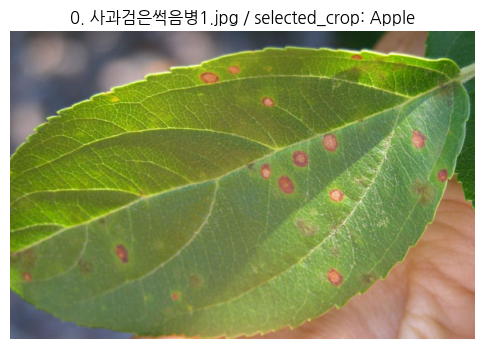

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Apple,Apple___Apple_scab,0.2839
1,38realmix,2,Apple,Apple___healthy,0.0996
2,38realmix,3,Apple,Apple___Black_rot,0.0403
3,38realmix,4,Apple,Apple___Cedar_apple_rust,0.0019
4,pvprep30,1,Apple,Apple___Apple_scab,0.9639
5,pvprep30,2,Apple,Apple___healthy,0.0198
6,pvprep30,3,Apple,Apple___Black_rot,0.0087
7,pvprep30,4,Apple,Apple___Cedar_apple_rust,0.0005
8,pvprep50,1,Apple,Apple___Apple_scab,0.7827
9,pvprep50,2,Apple,Apple___healthy,0.1193


[1] 사과삼나무사과녹병1.jpg
selected_crop: Apple


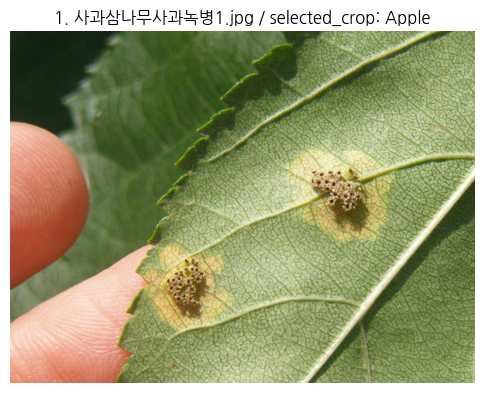

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Apple,Apple___healthy,0.0006
1,38realmix,2,Apple,Apple___Black_rot,0.0002
2,38realmix,3,Apple,Apple___Apple_scab,0.0001
3,38realmix,4,Apple,Apple___Cedar_apple_rust,0.0001
4,pvprep30,1,Apple,Apple___Cedar_apple_rust,0.1066
5,pvprep30,2,Apple,Apple___Black_rot,0.0783
6,pvprep30,3,Apple,Apple___Apple_scab,0.0078
7,pvprep30,4,Apple,Apple___healthy,0.0025
8,pvprep50,1,Apple,Apple___Cedar_apple_rust,0.0190
9,pvprep50,2,Apple,Apple___healthy,0.0076


[2] 사과삼나무사과녹병2.jpg
selected_crop: Apple


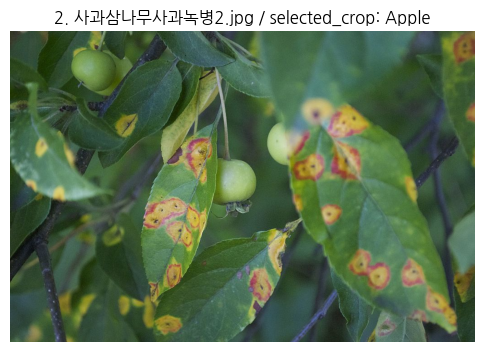

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Apple,Apple___Black_rot,0.0317
1,38realmix,2,Apple,Apple___Cedar_apple_rust,0.0234
2,38realmix,3,Apple,Apple___healthy,0.0025
3,38realmix,4,Apple,Apple___Apple_scab,0.0025
4,pvprep30,1,Apple,Apple___Black_rot,0.6907
5,pvprep30,2,Apple,Apple___Cedar_apple_rust,0.1184
6,pvprep30,3,Apple,Apple___Apple_scab,0.0016
7,pvprep30,4,Apple,Apple___healthy,0.0001
8,pvprep50,1,Apple,Apple___Cedar_apple_rust,0.4146
9,pvprep50,2,Apple,Apple___Black_rot,0.2037


[3] 옥수수북부잎마름병1.jpg
selected_crop: Corn_(maize)


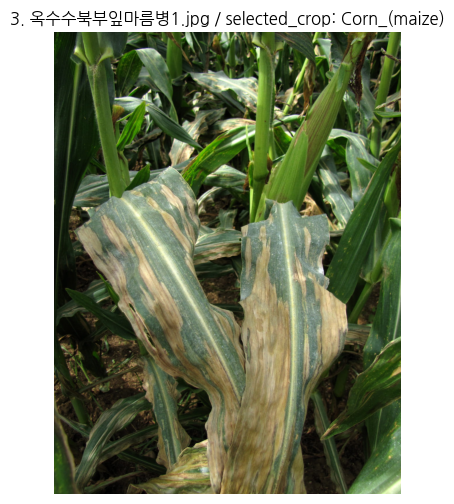

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Corn_(maize),Corn_(maize)___Common_rust_,0.7128
1,38realmix,2,Corn_(maize),Corn_(maize)___Northern_Leaf_Blight,0.2870
2,38realmix,3,Corn_(maize),Corn_(maize)___healthy,0.0000
3,38realmix,4,Corn_(maize),Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0000
4,pvprep30,1,Corn_(maize),Corn_(maize)___Common_rust_,0.9303
5,pvprep30,2,Corn_(maize),Corn_(maize)___Northern_Leaf_Blight,0.0697
6,pvprep30,3,Corn_(maize),Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0000
7,pvprep30,4,Corn_(maize),Corn_(maize)___healthy,0.0000
8,pvprep50,1,Corn_(maize),Corn_(maize)___Common_rust_,0.9313
9,pvprep50,2,Corn_(maize),Corn_(maize)___Northern_Leaf_Blight,0.0687


[4] 옥수수세르코스포라잎반점병2.jpg
selected_crop: Corn_(maize)


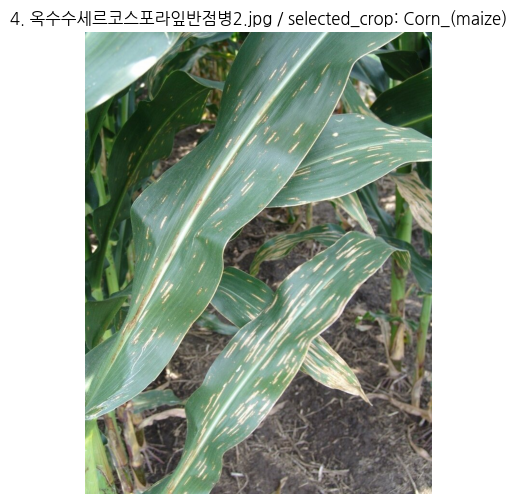

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Corn_(maize),Corn_(maize)___Northern_Leaf_Blight,0.5758
1,38realmix,2,Corn_(maize),Corn_(maize)___Common_rust_,0.4132
2,38realmix,3,Corn_(maize),Corn_(maize)___healthy,0.0026
3,38realmix,4,Corn_(maize),Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0020
4,pvprep30,1,Corn_(maize),Corn_(maize)___Northern_Leaf_Blight,0.5627
5,pvprep30,2,Corn_(maize),Corn_(maize)___Common_rust_,0.4354
6,pvprep30,3,Corn_(maize),Corn_(maize)___healthy,0.0002
7,pvprep30,4,Corn_(maize),Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0000
8,pvprep50,1,Corn_(maize),Corn_(maize)___Common_rust_,0.6209
9,pvprep50,2,Corn_(maize),Corn_(maize)___Northern_Leaf_Blight,0.3729


[5] 토마토건강1.jpg
selected_crop: Tomato


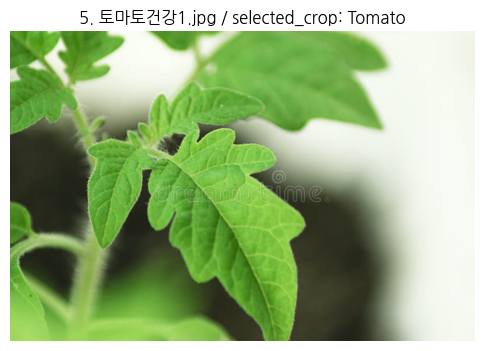

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Tomato,Tomato___healthy,0.2744
1,38realmix,2,Tomato,Tomato___Target_Spot,0.1630
2,38realmix,3,Tomato,Tomato___Late_blight,0.1502
3,38realmix,4,Tomato,Tomato___Tomato_Yellow_Leaf_Curl_Virus,0.1317
4,38realmix,5,Tomato,Tomato___Tomato_mosaic_virus,0.0614
5,pvprep30,1,Tomato,Tomato___Late_blight,0.9460
6,pvprep30,2,Tomato,Tomato___Target_Spot,0.0186
7,pvprep30,3,Tomato,Tomato___healthy,0.0107
8,pvprep30,4,Tomato,Tomato___Septoria_leaf_spot,0.0001
9,pvprep30,5,Tomato,Tomato___Early_blight,0.0000


[6] 토마토건강2.jpg
selected_crop: Tomato


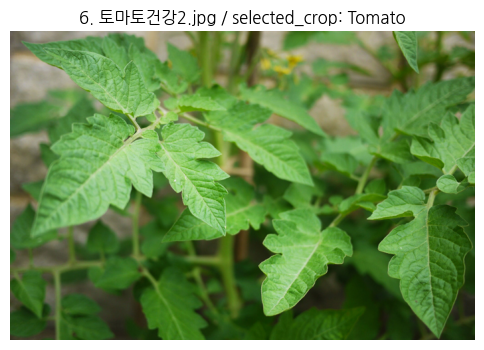

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Tomato,Tomato___Target_Spot,0.0719
1,38realmix,2,Tomato,Tomato___healthy,0.0003
2,38realmix,3,Tomato,Tomato___Spider_mites Two-spotted_spider_mite,0.0002
3,38realmix,4,Tomato,Tomato___Late_blight,0.0001
4,38realmix,5,Tomato,Tomato___Bacterial_spot,0.0001
5,pvprep30,1,Tomato,Tomato___Target_Spot,0.0031
6,pvprep30,2,Tomato,Tomato___Late_blight,0.0001
7,pvprep30,3,Tomato,Tomato___Early_blight,0.0000
8,pvprep30,4,Tomato,Tomato___Septoria_leaf_spot,0.0000
9,pvprep30,5,Tomato,Tomato___healthy,0.0000


[7] 토마토전기역병1.jpg
selected_crop: Tomato


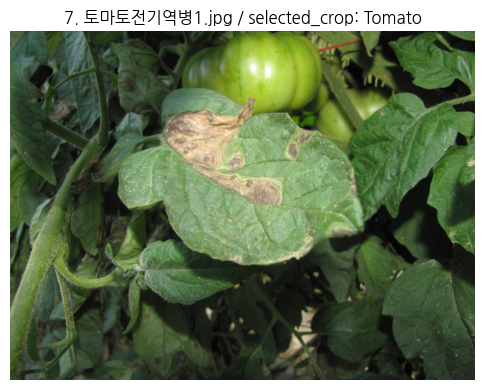

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Tomato,Tomato___healthy,0.0322
1,38realmix,2,Tomato,Tomato___Late_blight,0.0113
2,38realmix,3,Tomato,Tomato___Septoria_leaf_spot,0.0057
3,38realmix,4,Tomato,Tomato___Early_blight,0.0054
4,38realmix,5,Tomato,Tomato___Bacterial_spot,0.0020
5,pvprep30,1,Tomato,Tomato___Early_blight,0.0048
6,pvprep30,2,Tomato,Tomato___Late_blight,0.0040
7,pvprep30,3,Tomato,Tomato___Septoria_leaf_spot,0.0001
8,pvprep30,4,Tomato,Tomato___Bacterial_spot,0.0001
9,pvprep30,5,Tomato,Tomato___healthy,0.0000


[8] 토마토점무늬병1.jpg
selected_crop: Tomato


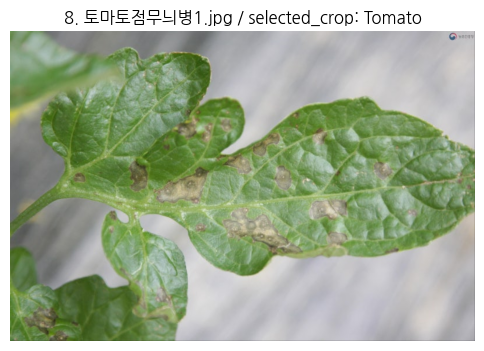

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Tomato,Tomato___Target_Spot,0.1753
1,38realmix,2,Tomato,Tomato___healthy,0.0599
2,38realmix,3,Tomato,Tomato___Early_blight,0.0478
3,38realmix,4,Tomato,Tomato___Septoria_leaf_spot,0.0022
4,38realmix,5,Tomato,Tomato___Late_blight,0.0008
5,pvprep30,1,Tomato,Tomato___Early_blight,0.0006
6,pvprep30,2,Tomato,Tomato___Target_Spot,0.0000
7,pvprep30,3,Tomato,Tomato___Septoria_leaf_spot,0.0000
8,pvprep30,4,Tomato,Tomato___Late_blight,0.0000
9,pvprep30,5,Tomato,Tomato___healthy,0.0000


[9] 토마토점무늬병2.webp
selected_crop: Tomato


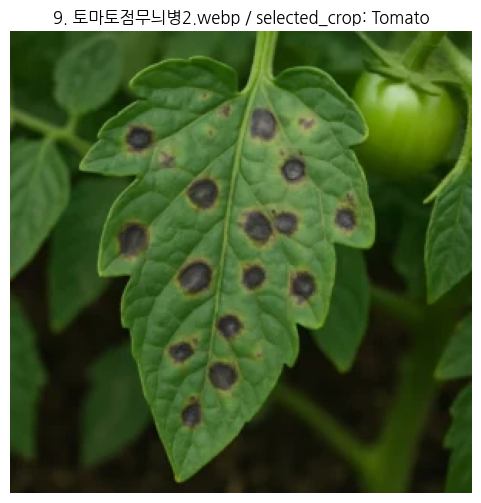

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Tomato,Tomato___healthy,0.4444
1,38realmix,2,Tomato,Tomato___Late_blight,0.1947
2,38realmix,3,Tomato,Tomato___Leaf_Mold,0.0485
3,38realmix,4,Tomato,Tomato___Early_blight,0.0224
4,38realmix,5,Tomato,Tomato___Spider_mites Two-spotted_spider_mite,0.0078
5,pvprep30,1,Tomato,Tomato___Early_blight,0.4148
6,pvprep30,2,Tomato,Tomato___Late_blight,0.3123
7,pvprep30,3,Tomato,Tomato___Septoria_leaf_spot,0.0072
8,pvprep30,4,Tomato,Tomato___healthy,0.0051
9,pvprep30,5,Tomato,Tomato___Target_Spot,0.0000


[10] 포도건강1.jpg
selected_crop: Grape


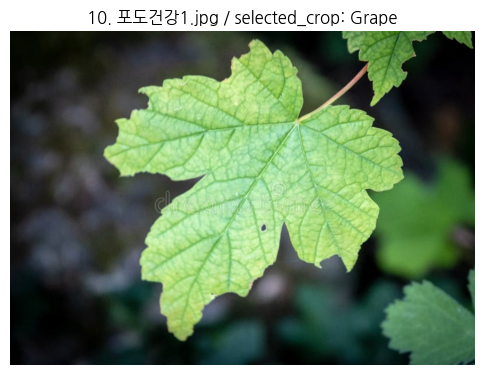

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Grape,Grape___healthy,0.1017
1,38realmix,2,Grape,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0785
2,38realmix,3,Grape,Grape___Esca_(Black_Measles),0.0365
3,38realmix,4,Grape,Grape___Black_rot,0.0000
4,pvprep30,1,Grape,Grape___healthy,0.1006
5,pvprep30,2,Grape,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0220
6,pvprep30,3,Grape,Grape___Esca_(Black_Measles),0.0205
7,pvprep30,4,Grape,Grape___Black_rot,0.0000
8,pvprep50,1,Grape,Grape___healthy,0.0854
9,pvprep50,2,Grape,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0507


[11] 포도잎마름병1.jpg
selected_crop: Grape


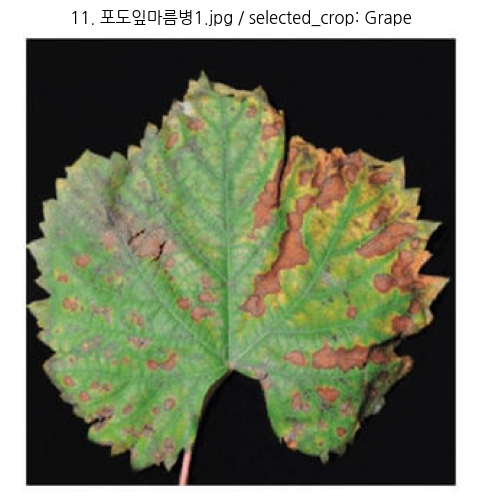

,model,rank,selected_crop,pred_class,confidence
0,38realmix,1,Grape,Grape___Esca_(Black_Measles),0.0030
1,38realmix,2,Grape,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0013
2,38realmix,3,Grape,Grape___healthy,0.0000
3,38realmix,4,Grape,Grape___Black_rot,0.0000
4,pvprep30,1,Grape,Grape___Esca_(Black_Measles),0.0000
5,pvprep30,2,Grape,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0000
6,pvprep30,3,Grape,Grape___healthy,0.0000
7,pvprep30,4,Grape,Grape___Black_rot,0.0000
8,pvprep50,1,Grape,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0001
9,pvprep50,2,Grape,Grape___Esca_(Black_Measles),0.0000


In [16]:
# ============================================================
# 작물 필터링 Top-K 예측 함수
# selected_crop에 해당하는 클래스만 대상으로 Top-K 추출
# ============================================================

def predict_topk_filtered(model, image_path, selected_crop, top_k=5):
    image = Image.open(image_path).convert("RGB")
    input_tensor = test_transform(image).unsqueeze(0).to(DEVICE)

    # selected_crop으로 시작하는 클래스 index만 추출
    crop_indices = [
        idx for idx, class_name in enumerate(class_names)
        if class_name.startswith(selected_crop)
    ]

    if len(crop_indices) == 0:
        raise ValueError(f"selected_crop에 해당하는 클래스가 없습니다: {selected_crop}")

    with torch.no_grad():
        outputs = model(input_tensor)
        probs = torch.softmax(outputs, dim=1)[0]

        # 해당 작물 클래스 confidence만 가져오기
        crop_probs = probs[crop_indices]

        # 작물 내부에서 Top-K 추출
        actual_top_k = min(top_k, len(crop_indices))
        top_probs, top_local_indices = torch.topk(
            crop_probs,
            k=actual_top_k
        )

    results = []

    for rank, (local_idx, prob) in enumerate(
        zip(top_local_indices.cpu().numpy(), top_probs.cpu().numpy()),
        start=1
    ):
        original_idx = crop_indices[local_idx]

        results.append({
            "rank": rank,
            "class": class_names[original_idx],
            "confidence": round(float(prob), 4)
        })

    return results


# ============================================================
# 이미지 1장씩 확인하는 함수
# 작물별 필터링 후 모델별 Top1~Top5 출력
# ============================================================

def show_prediction_by_index(index):
    test_item = ambiguous_tests[index]

    img_path = test_item["img_path"]
    selected_crop = test_item["selected_crop"]

    if not os.path.exists(img_path):
        print("이미지 없음:", img_path)
        return

    image = Image.open(img_path).convert("RGB")

    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"{index}. {Path(img_path).name} / selected_crop: {selected_crop}")
    plt.show()

    rows = []

    for model_name, model in models_dict.items():
        pred_results = predict_topk_filtered(
            model=model,
            image_path=img_path,
            selected_crop=selected_crop,
            top_k=TOP_K
        )

        for item in pred_results:
            rows.append({
                "model": model_name,
                "rank": item["rank"],
                "selected_crop": selected_crop,
                "pred_class": item["class"],
                "confidence": item["confidence"]
            })

    result_df = pd.DataFrame(rows)

    display(result_df)

    return result_df

for idx in range(len(ambiguous_tests)):
    print("=" * 100)
    print(f"[{idx}] {Path(ambiguous_tests[idx]['img_path']).name}")
    print("selected_crop:", ambiguous_tests[idx]["selected_crop"])

    show_prediction_by_index(idx)
    

In [9]:
# ============================================================
# ambiguous 이미지 비교 결과 CSV 시각화 코드
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

CSV_PATH = "compare_ambiguous_images_38realmix_pvprep30_50_70.csv"

df = pd.read_csv(CSV_PATH)

MODELS = ["38realmix", "pvprep30", "pvprep50", "pvprep70"]

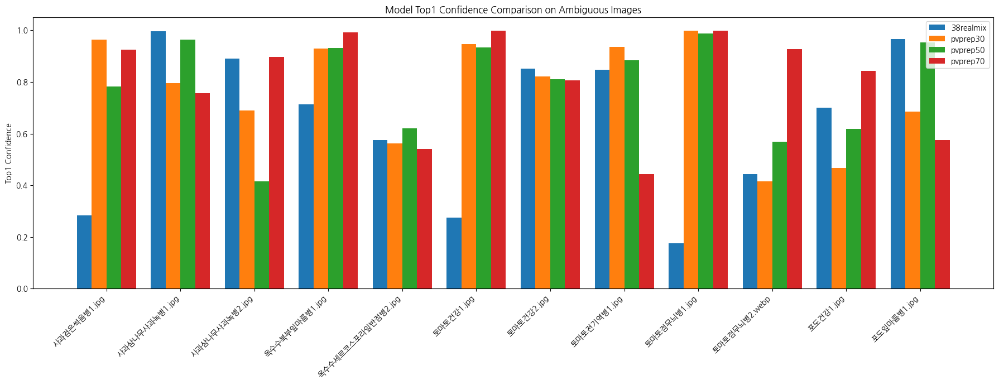

In [11]:
# ============================================================
# 1. 이미지별 모델 Top1 confidence 비교 막대그래프
# ============================================================
import koreanize_matplotlib
image_names = df["image_name"].tolist()

x = np.arange(len(image_names))
width = 0.2

plt.figure(figsize=(18, 7))

for i, model_name in enumerate(MODELS):
    conf_col = f"{model_name}_top1_conf"
    plt.bar(
        x + (i - 1.5) * width,
        df[conf_col],
        width,
        label=model_name
    )

plt.xticks(x, image_names, rotation=45, ha="right")
plt.ylim(0, 1.05)
plt.ylabel("Top1 Confidence")
plt.title("Model Top1 Confidence Comparison on Ambiguous Images")
plt.legend()
plt.tight_layout()
plt.savefig("graph_top1_confidence_comparison.png", dpi=200)
plt.show()


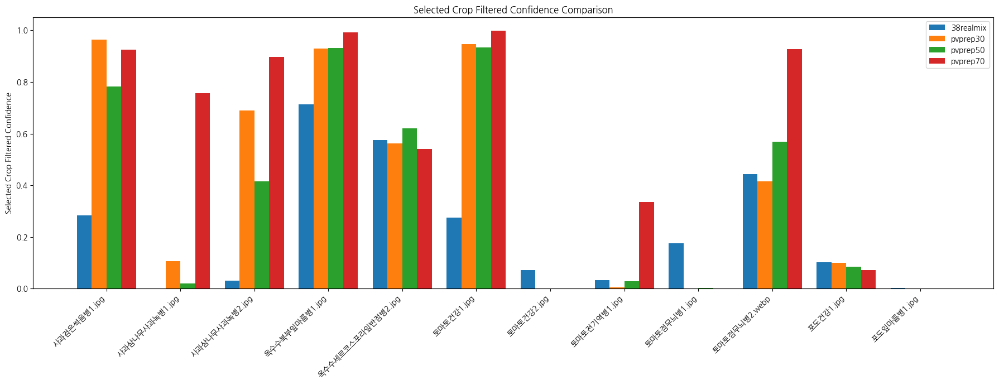

In [12]:
# ============================================================
# 2. selected_crop 기준 confidence 비교 그래프
#    예: Tomato 이미지면 Tomato 계열 후보 confidence
# ============================================================

plt.figure(figsize=(18, 7))

for i, model_name in enumerate(MODELS):
    conf_col = f"{model_name}_crop_filtered_conf"
    plt.bar(
        x + (i - 1.5) * width,
        df[conf_col],
        width,
        label=model_name
    )

plt.xticks(x, image_names, rotation=45, ha="right")
plt.ylim(0, 1.05)
plt.ylabel("Selected Crop Filtered Confidence")
plt.title("Selected Crop Filtered Confidence Comparison")
plt.legend()
plt.tight_layout()
plt.savefig("graph_crop_filtered_confidence_comparison.png", dpi=200)
plt.show()


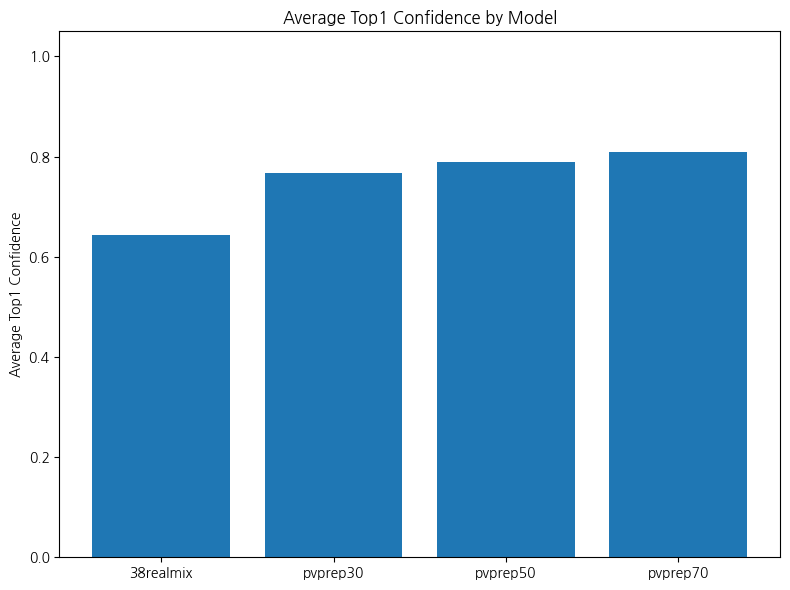

In [13]:
# ============================================================
# 3. 모델별 평균 Top1 confidence 비교
# ============================================================

avg_top1_conf = []

for model_name in MODELS:
    conf_col = f"{model_name}_top1_conf"
    avg_top1_conf.append(df[conf_col].mean())

plt.figure(figsize=(8, 6))
plt.bar(MODELS, avg_top1_conf)
plt.ylim(0, 1.05)
plt.ylabel("Average Top1 Confidence")
plt.title("Average Top1 Confidence by Model")
plt.tight_layout()
plt.savefig("graph_avg_top1_confidence.png", dpi=200)
plt.show()

In [17]:
# ============================================================
# pvprep30 BEST CP 모델 로드 후
# real_crop_38cls_preprocessed 추가학습
# ============================================================

import os
import json
import torch
import random
import numpy as np
import torch.nn as nn
import torch.optim as optim

from tqdm import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader


# ============================================================
# 기본 설정
# ============================================================

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ============================================================
# 추가학습 데이터
# ============================================================

TRAIN_DIR = "/home/harry/Re_leaf_Project/real_crop_38cls_preprocessed"

# 기존 원본 validation 사용
VALID_DIR = "/home/harry/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

# ============================================================
# 베이스 모델 (BEST CP)
# ============================================================

BASE_MODEL_PATH = "/home/harry/Re_leaf_Project/cp_convnext_tiny_38realmix_pvprep30_finetuned.pth"

# ============================================================
# 저장 경로
# ============================================================

SAVE_CP_PATH = "/home/harry/Re_leaf_Project/cp_convnext_tiny_38realmix_pvprep30_realprep_finetuned.pth"

SAVE_MODEL_PATH = "/home/harry/Re_leaf_Project/model_convnext_tiny_38realmix_pvprep30_realprep_finetuned.pth"

CLASS_NAMES_PATH = "/home/harry/Re_leaf_Project/class_names_38.json"

# ============================================================
# 하이퍼파라미터
# ============================================================

IMG_SIZE = 224
BATCH_SIZE = 32

# real prep 추가학습이라 epoch 너무 길게 안감
EPOCHS = 5

# 이미 충분히 학습된 모델이라 LR 낮게
LR = 1e-5

SEED = 42
NUM_CLASSES = 38


# ============================================================
# seed 고정
# ============================================================

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(SEED)


# ============================================================
# transform
# ============================================================

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================================
# Dataset 준비
# ============================================================

train_dataset = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    root=VALID_DIR,
    transform=val_transform
)

# 클래스 순서 확인
assert train_dataset.classes == val_dataset.classes, \
    "train_dataset과 val_dataset 클래스 순서가 다릅니다."

class_names = train_dataset.classes

print("클래스 수:", len(class_names))
print("real prep train 이미지 수:", len(train_dataset))
print("원본 valid 이미지 수:", len(val_dataset))

# class_names 저장
with open(CLASS_NAMES_PATH, "w", encoding="utf-8") as f:
    json.dump(class_names, f, ensure_ascii=False, indent=4)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)


# ============================================================
# ConvNeXt Tiny 모델 생성
# ============================================================

model = models.convnext_tiny(weights=None)

# classifier 수정
in_features = model.classifier[2].in_features
model.classifier[2] = nn.Linear(in_features, NUM_CLASSES)

# ============================================================
# pvprep30 BEST CP 모델 weight 로드
# ============================================================

state_dict = torch.load(BASE_MODEL_PATH, map_location=DEVICE)

model.load_state_dict(state_dict)

model = model.to(DEVICE)

print("베이스 모델 로드 완료")
print(BASE_MODEL_PATH)


# ============================================================
# Loss / Optimizer
# ============================================================

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(
    model.parameters(),
    lr=LR,
    weight_decay=1e-4
)


# ============================================================
# 학습 함수
# ============================================================

def train_one_epoch(model, loader, criterion, optimizer):

    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(loader, desc="Train"):

        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        optimizer.zero_grad()

        outputs = model(images)

        loss = criterion(outputs, labels)

        loss.backward()

        optimizer.step()

        running_loss += loss.item() * images.size(0)

        preds = outputs.argmax(dim=1)

        correct += (preds == labels).sum().item()

        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


# ============================================================
# 검증 함수
# ============================================================

def validate(model, loader, criterion):

    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():

        for images, labels in tqdm(loader, desc="Valid"):

            images = images.to(DEVICE)
            labels = labels.to(DEVICE)

            outputs = model(images)

            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            preds = outputs.argmax(dim=1)

            correct += (preds == labels).sum().item()

            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


# ============================================================
# 학습 실행
# ============================================================

best_val_acc = 0.0

for epoch in range(EPOCHS):

    print(f"\nEpoch [{epoch+1}/{EPOCHS}]")

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer
    )

    val_loss, val_acc = validate(
        model,
        val_loader,
        criterion
    )

    print(f"Train Loss : {train_loss:.4f}")
    print(f"Train Acc  : {train_acc:.4f}")

    print(f"Val Loss   : {val_loss:.4f}")
    print(f"Val Acc    : {val_acc:.4f}")

    # ========================================================
    # BEST CP 저장
    # ========================================================

    if val_acc > best_val_acc:

        best_val_acc = val_acc

        torch.save(
            model.state_dict(),
            SAVE_CP_PATH
        )

        print("\nBEST CHECKPOINT 저장 완료")
        print(SAVE_CP_PATH)

        print(f"Best Val Acc : {best_val_acc:.4f}")


# ============================================================
# 최종 모델 저장
# ============================================================

torch.save(
    model.state_dict(),
    SAVE_MODEL_PATH
)

print("\n추가학습 완료")
print("최종 모델 저장 완료")

print("MODEL:")
print(SAVE_MODEL_PATH)

print("\nBEST CP:")
print(SAVE_CP_PATH)

print(f"\n최고 Validation Accuracy: {best_val_acc:.4f}")

클래스 수: 38
real prep train 이미지 수: 717
원본 valid 이미지 수: 17572


/tmp/ipykernel_1554/4286971138.py:164: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(BASE_MODEL_PATH, map_location=DEVICE)


베이스 모델 로드 완료
/home/harry/Re_leaf_Project/cp_convnext_tiny_38realmix_pvprep30_finetuned.pth

Epoch [1/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:25<00:00, 21.95it/s]


Train Loss : 3.6965
Train Acc  : 0.4909
Val Loss   : 0.0507
Val Acc    : 0.9857

BEST CHECKPOINT 저장 완료
/home/harry/Re_leaf_Project/cp_convnext_tiny_38realmix_pvprep30_realprep_finetuned.pth
Best Val Acc : 0.9857

Epoch [2/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:25<00:00, 21.66it/s]


Train Loss : 2.4240
Train Acc  : 0.5537
Val Loss   : 0.0554
Val Acc    : 0.9828

Epoch [3/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.08it/s]


Train Loss : 1.8509
Train Acc  : 0.5927
Val Loss   : 0.0727
Val Acc    : 0.9778

Epoch [4/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.33it/s]


Train Loss : 1.5094
Train Acc  : 0.6499
Val Loss   : 0.0680
Val Acc    : 0.9783

Epoch [5/5]


Valid: 100%|██████████████████████████████████████████████████████████████████████████| 550/550 [00:28<00:00, 19.25it/s]

Train Loss : 1.2891
Train Acc  : 0.6667
Val Loss   : 0.0698
Val Acc    : 0.9781

추가학습 완료
최종 모델 저장 완료
MODEL:
/home/harry/Re_leaf_Project/model_convnext_tiny_38realmix_pvprep30_realprep_finetuned.pth

BEST CP:
/home/harry/Re_leaf_Project/cp_convnext_tiny_38realmix_pvprep30_realprep_finetuned.pth

최고 Validation Accuracy: 0.9857


In [18]:
# ============================================================
# 비교 모델
# ============================================================

MODEL_PATHS = {

    "pvprep30":
    "/home/harry/Re_leaf_Project/cp_convnext_tiny_38realmix_pvprep30_finetuned.pth",

    "pvprep30_realprep":
    "/home/harry/Re_leaf_Project/cp_convnext_tiny_38realmix_pvprep30_realprep_finetuned.pth",
}


모델 로드 중: pvprep30


/tmp/ipykernel_1554/1070872851.py:147: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(model_path, map_location=DEVICE)


모델 로드 중: pvprep30_realprep

모델 로드 완료
[0] 사과검은썩음병1.jpg
selected_crop: Apple


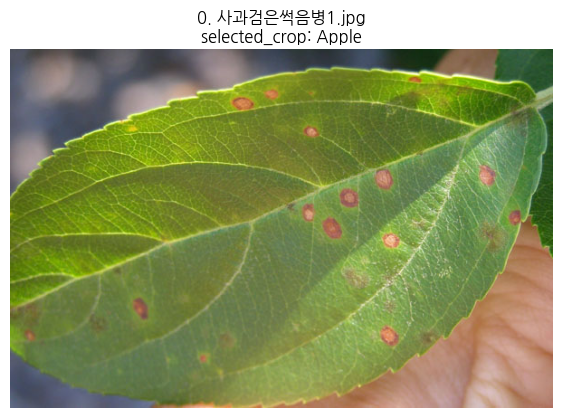

,model,rank,pred_class,confidence
0,pvprep30,1,Apple___Apple_scab,0.9639
1,pvprep30,2,Apple___healthy,0.0198
2,pvprep30,3,Apple___Black_rot,0.0087
3,pvprep30,4,Apple___Cedar_apple_rust,0.0005
4,pvprep30_realprep,1,Apple___Apple_scab,0.8171
5,pvprep30_realprep,2,Apple___healthy,0.0106
6,pvprep30_realprep,3,Apple___Black_rot,0.0055
7,pvprep30_realprep,4,Apple___Cedar_apple_rust,0.0029


[1] 사과삼나무사과녹병1.jpg
selected_crop: Apple


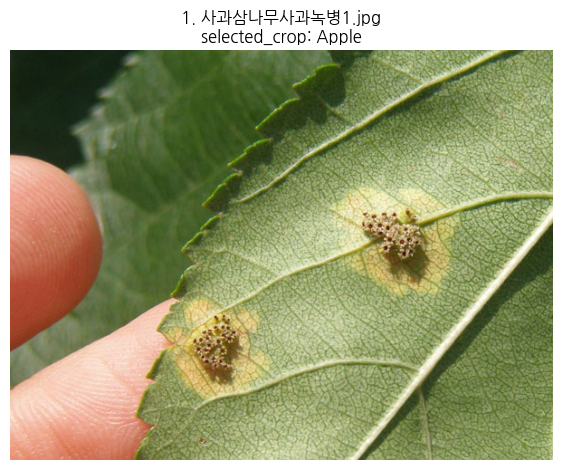

,model,rank,pred_class,confidence
0,pvprep30,1,Apple___Cedar_apple_rust,0.1066
1,pvprep30,2,Apple___Black_rot,0.0783
2,pvprep30,3,Apple___Apple_scab,0.0078
3,pvprep30,4,Apple___healthy,0.0025
4,pvprep30_realprep,1,Apple___Cedar_apple_rust,0.0113
5,pvprep30_realprep,2,Apple___Black_rot,0.0019
6,pvprep30_realprep,3,Apple___Apple_scab,0.0019
7,pvprep30_realprep,4,Apple___healthy,0.0003


[2] 사과삼나무사과녹병2.jpg
selected_crop: Apple


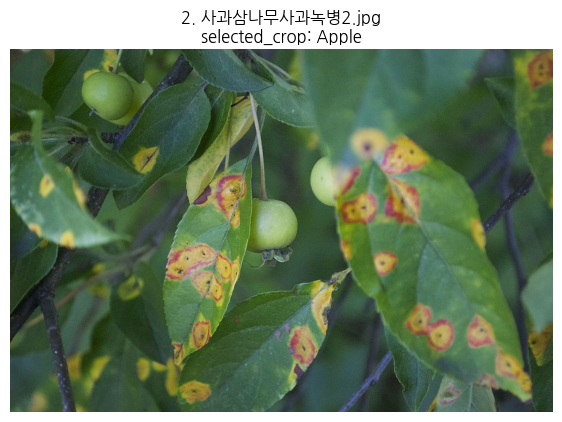

,model,rank,pred_class,confidence
0,pvprep30,1,Apple___Black_rot,0.6907
1,pvprep30,2,Apple___Cedar_apple_rust,0.1184
2,pvprep30,3,Apple___Apple_scab,0.0016
3,pvprep30,4,Apple___healthy,0.0001
4,pvprep30_realprep,1,Apple___Black_rot,0.1543
5,pvprep30_realprep,2,Apple___Cedar_apple_rust,0.0475
6,pvprep30_realprep,3,Apple___Apple_scab,0.0010
7,pvprep30_realprep,4,Apple___healthy,0.0000


[3] 옥수수북부잎마름병1.jpg
selected_crop: Corn_(maize)


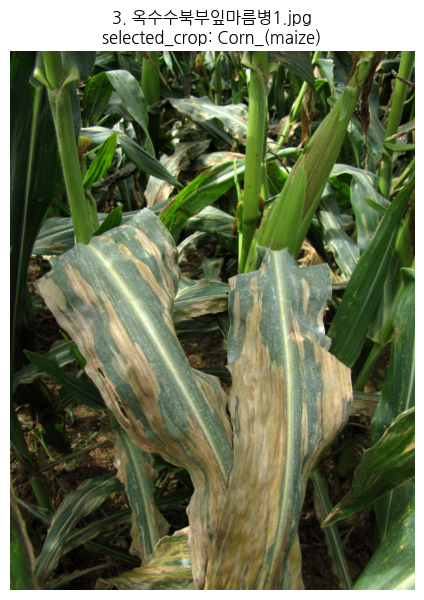

,model,rank,pred_class,confidence
0,pvprep30,1,Corn_(maize)___Common_rust_,0.9303
1,pvprep30,2,Corn_(maize)___Northern_Leaf_Blight,0.0697
2,pvprep30,3,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0000
3,pvprep30,4,Corn_(maize)___healthy,0.0000
4,pvprep30_realprep,1,Corn_(maize)___Common_rust_,0.9748
5,pvprep30_realprep,2,Corn_(maize)___Northern_Leaf_Blight,0.0252
6,pvprep30_realprep,3,Corn_(maize)___healthy,0.0000
7,pvprep30_realprep,4,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0000


[4] 옥수수세르코스포라잎반점병2.jpg
selected_crop: Corn_(maize)


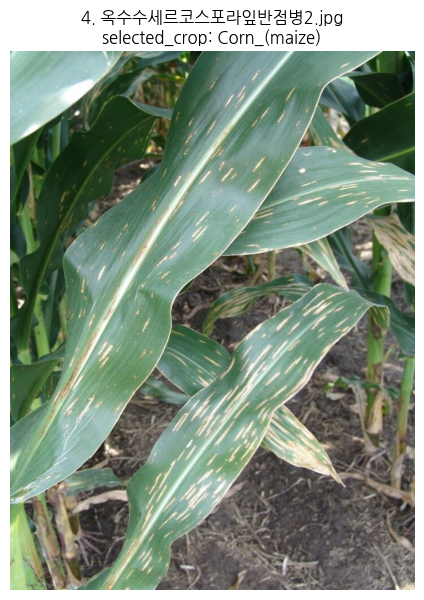

,model,rank,pred_class,confidence
0,pvprep30,1,Corn_(maize)___Northern_Leaf_Blight,0.5627
1,pvprep30,2,Corn_(maize)___Common_rust_,0.4354
2,pvprep30,3,Corn_(maize)___healthy,0.0002
3,pvprep30,4,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0000
4,pvprep30_realprep,1,Corn_(maize)___Common_rust_,0.6008
5,pvprep30_realprep,2,Corn_(maize)___Northern_Leaf_Blight,0.3966
6,pvprep30_realprep,3,Corn_(maize)___healthy,0.0008
7,pvprep30_realprep,4,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,0.0002


[5] 토마토건강1.jpg
selected_crop: Tomato


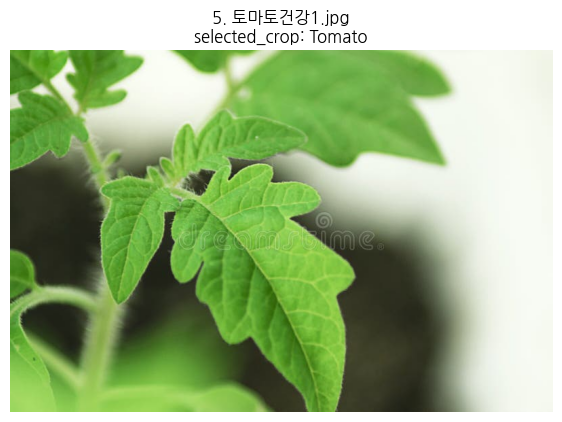

,model,rank,pred_class,confidence
0,pvprep30,1,Tomato___Late_blight,0.9460
1,pvprep30,2,Tomato___Target_Spot,0.0186
2,pvprep30,3,Tomato___healthy,0.0107
3,pvprep30,4,Tomato___Septoria_leaf_spot,0.0001
4,pvprep30,5,Tomato___Early_blight,0.0000
5,pvprep30_realprep,1,Tomato___Late_blight,0.7056
6,pvprep30_realprep,2,Tomato___healthy,0.2089
7,pvprep30_realprep,3,Tomato___Target_Spot,0.0592
8,pvprep30_realprep,4,Tomato___Tomato_mosaic_virus,0.0018
9,pvprep30_realprep,5,Tomato___Septoria_leaf_spot,0.0010


[6] 토마토건강2.jpg
selected_crop: Tomato


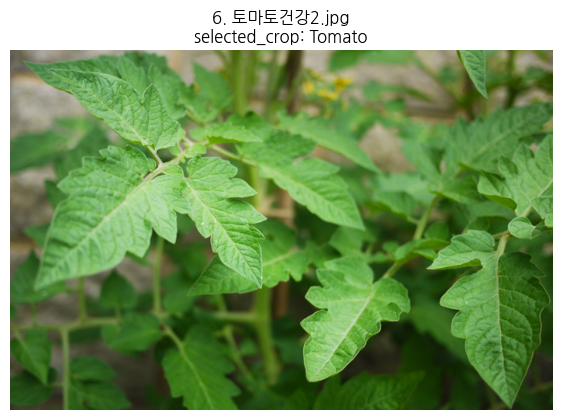

,model,rank,pred_class,confidence
0,pvprep30,1,Tomato___Target_Spot,0.0031
1,pvprep30,2,Tomato___Late_blight,0.0001
2,pvprep30,3,Tomato___Early_blight,0.0000
3,pvprep30,4,Tomato___Septoria_leaf_spot,0.0000
4,pvprep30,5,Tomato___healthy,0.0000
5,pvprep30_realprep,1,Tomato___Target_Spot,0.0829
6,pvprep30_realprep,2,Tomato___Late_blight,0.0030
7,pvprep30_realprep,3,Tomato___healthy,0.0015
8,pvprep30_realprep,4,Tomato___Septoria_leaf_spot,0.0000
9,pvprep30_realprep,5,Tomato___Spider_mites Two-spotted_spider_mite,0.0000


[7] 토마토전기역병1.jpg
selected_crop: Tomato


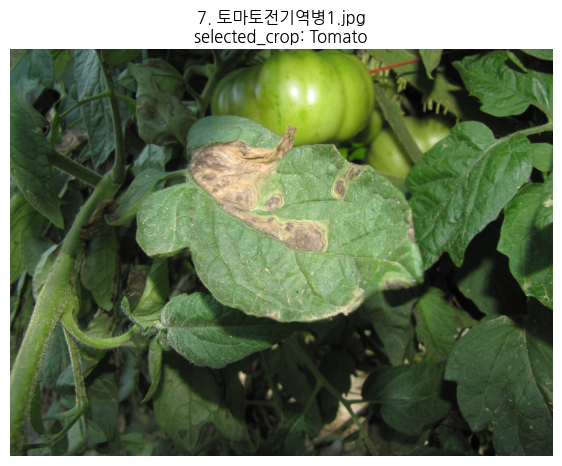

,model,rank,pred_class,confidence
0,pvprep30,1,Tomato___Early_blight,0.0048
1,pvprep30,2,Tomato___Late_blight,0.0040
2,pvprep30,3,Tomato___Septoria_leaf_spot,0.0001
3,pvprep30,4,Tomato___Bacterial_spot,0.0001
4,pvprep30,5,Tomato___healthy,0.0000
5,pvprep30_realprep,1,Tomato___Late_blight,0.1370
6,pvprep30_realprep,2,Tomato___healthy,0.0161
7,pvprep30_realprep,3,Tomato___Early_blight,0.0146
8,pvprep30_realprep,4,Tomato___Bacterial_spot,0.0117
9,pvprep30_realprep,5,Tomato___Septoria_leaf_spot,0.0099


[8] 토마토점무늬병1.jpg
selected_crop: Tomato


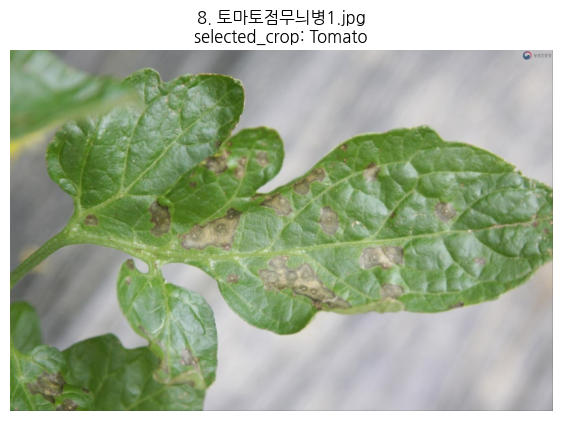

,model,rank,pred_class,confidence
0,pvprep30,1,Tomato___Early_blight,0.0006
1,pvprep30,2,Tomato___Target_Spot,0.0000
2,pvprep30,3,Tomato___Septoria_leaf_spot,0.0000
3,pvprep30,4,Tomato___Late_blight,0.0000
4,pvprep30,5,Tomato___healthy,0.0000
5,pvprep30_realprep,1,Tomato___Early_blight,0.0066
6,pvprep30_realprep,2,Tomato___Target_Spot,0.0040
7,pvprep30_realprep,3,Tomato___Septoria_leaf_spot,0.0020
8,pvprep30_realprep,4,Tomato___healthy,0.0012
9,pvprep30_realprep,5,Tomato___Late_blight,0.0007


[9] 토마토점무늬병2.webp
selected_crop: Tomato


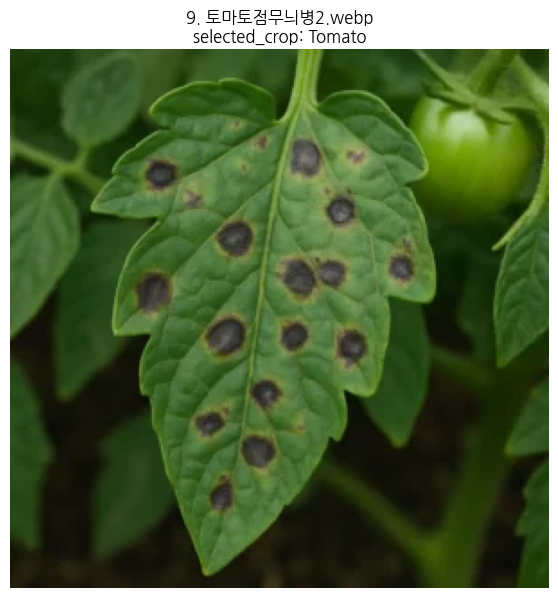

,model,rank,pred_class,confidence
0,pvprep30,1,Tomato___Early_blight,0.4148
1,pvprep30,2,Tomato___Late_blight,0.3123
2,pvprep30,3,Tomato___Septoria_leaf_spot,0.0072
3,pvprep30,4,Tomato___healthy,0.0051
4,pvprep30,5,Tomato___Target_Spot,0.0000
5,pvprep30_realprep,1,Tomato___Late_blight,0.6468
6,pvprep30_realprep,2,Tomato___healthy,0.1659
7,pvprep30_realprep,3,Tomato___Early_blight,0.0820
8,pvprep30_realprep,4,Tomato___Septoria_leaf_spot,0.0499
9,pvprep30_realprep,5,Tomato___Leaf_Mold,0.0042


[10] 포도건강1.jpg
selected_crop: Grape


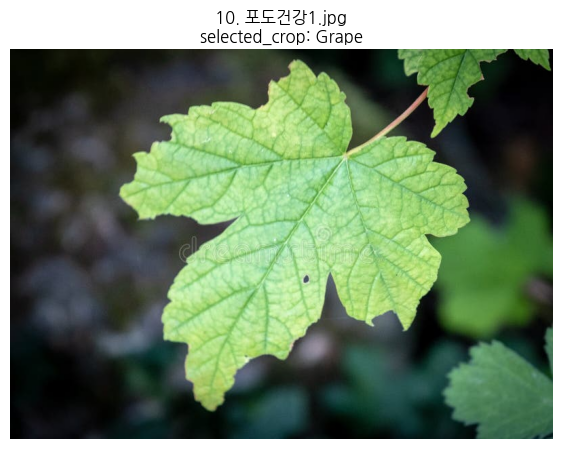

,model,rank,pred_class,confidence
0,pvprep30,1,Grape___healthy,0.1006
1,pvprep30,2,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0220
2,pvprep30,3,Grape___Esca_(Black_Measles),0.0205
3,pvprep30,4,Grape___Black_rot,0.0000
4,pvprep30_realprep,1,Grape___healthy,0.1156
5,pvprep30_realprep,2,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0053
6,pvprep30_realprep,3,Grape___Esca_(Black_Measles),0.0050
7,pvprep30_realprep,4,Grape___Black_rot,0.0000


[11] 포도잎마름병1.jpg
selected_crop: Grape


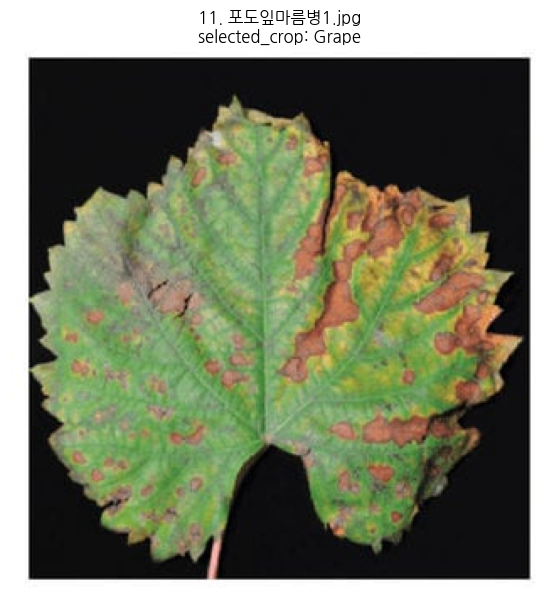

,model,rank,pred_class,confidence
0,pvprep30,1,Grape___Esca_(Black_Measles),0.0000
1,pvprep30,2,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0000
2,pvprep30,3,Grape___healthy,0.0000
3,pvprep30,4,Grape___Black_rot,0.0000
4,pvprep30_realprep,1,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),0.0003
5,pvprep30_realprep,2,Grape___Esca_(Black_Measles),0.0002
6,pvprep30_realprep,3,Grape___healthy,0.0000
7,pvprep30_realprep,4,Grape___Black_rot,0.0000


In [20]:
models_dict = {}

for model_name, model_path in MODEL_PATHS.items():

    print(f"모델 로드 중: {model_name}")

    models_dict[model_name] = create_convnext_model(
        model_path
    )

print("\n모델 로드 완료")

# ============================================================
# 이미지별 예측 결과 출력 함수
# ============================================================

def show_prediction_by_index(index):

    test_item = ambiguous_tests[index]

    img_path = test_item["img_path"]

    selected_crop = test_item["selected_crop"]

    if not os.path.exists(img_path):

        print("이미지 없음:", img_path)

        return

    image = Image.open(img_path).convert("RGB")

    plt.figure(figsize=(7, 7))

    plt.imshow(image)

    plt.axis("off")

    plt.title(
        f"{index}. {Path(img_path).name}\nselected_crop: {selected_crop}"
    )

    plt.show()

    rows = []

    for model_name, model in models_dict.items():

        pred_results = predict_topk_filtered(

            model=model,

            image_path=img_path,

            selected_crop=selected_crop,

            top_k=TOP_K
        )

        for item in pred_results:

            rows.append({

                "model": model_name,

                "rank": item["rank"],

                "pred_class": item["class"],

                "confidence": item["confidence"]
            })

    result_df = pd.DataFrame(rows)

    display(result_df)

    return result_df


# ============================================================
# 전체 이미지 비교
# ============================================================

for idx in range(len(ambiguous_tests)):

    print("=" * 100)

    print(f"[{idx}] {Path(ambiguous_tests[idx]['img_path']).name}")

    print("selected_crop:",
          ambiguous_tests[idx]["selected_crop"])

    show_prediction_by_index(idx)


IMAGE: /home/harry/Re_leaf_Project/Test_image/토마토건강1.jpg

MODEL: pvprep30


/tmp/ipykernel_1554/4112582273.py:88: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(


Predicted : Tomato___Late_blight
Confidence: 0.946


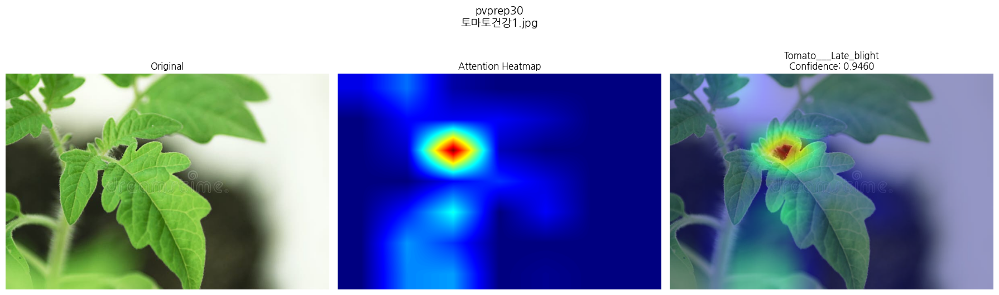


MODEL: pvprep30_realprep
Predicted : Tomato___Late_blight
Confidence: 0.7056


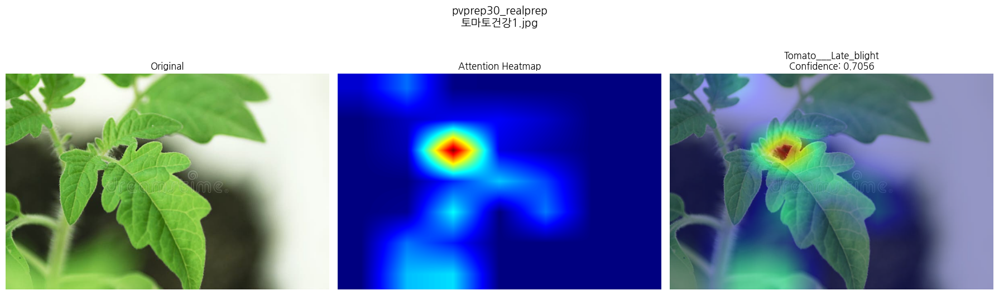


IMAGE: /home/harry/Re_leaf_Project/Test_image/토마토전기역병1.jpg

MODEL: pvprep30
Predicted : Apple___Black_rot
Confidence: 0.9363


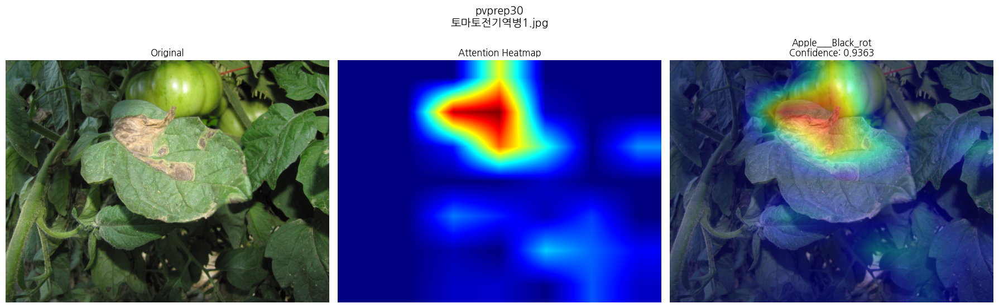


MODEL: pvprep30_realprep
Predicted : Potato___Late_blight
Confidence: 0.6518


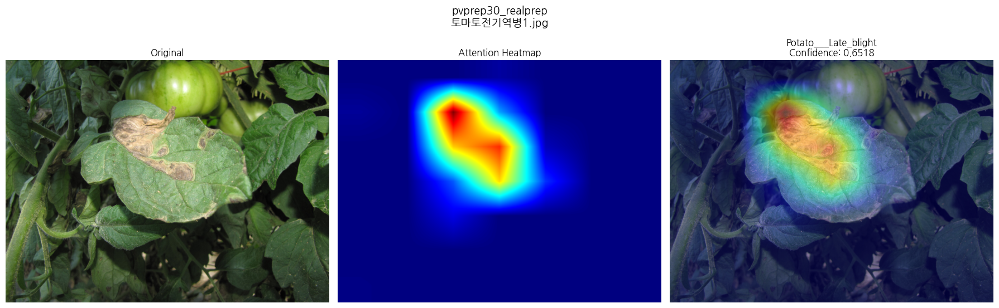


IMAGE: /home/harry/Re_leaf_Project/Test_image/사과삼나무사과녹병1.jpg

MODEL: pvprep30
Predicted : Grape___Black_rot
Confidence: 0.7967


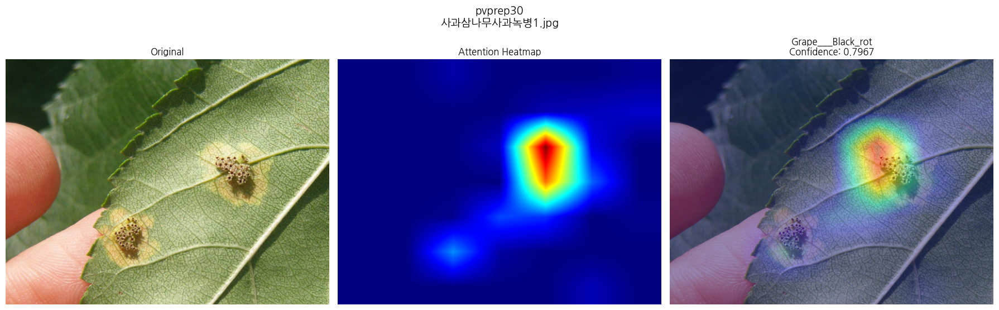


MODEL: pvprep30_realprep
Predicted : Grape___Black_rot
Confidence: 0.9715


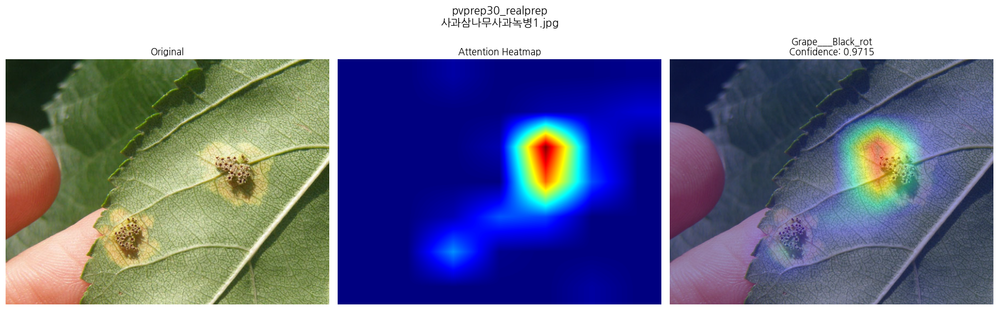


IMAGE: /home/harry/Re_leaf_Project/Test_image/옥수수북부잎마름병1.jpg

MODEL: pvprep30
Predicted : Corn_(maize)___Common_rust_
Confidence: 0.9303


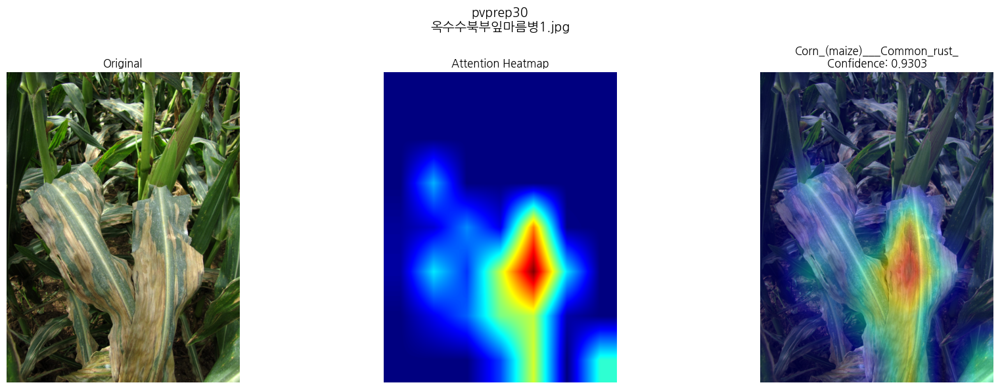


MODEL: pvprep30_realprep
Predicted : Corn_(maize)___Common_rust_
Confidence: 0.9748


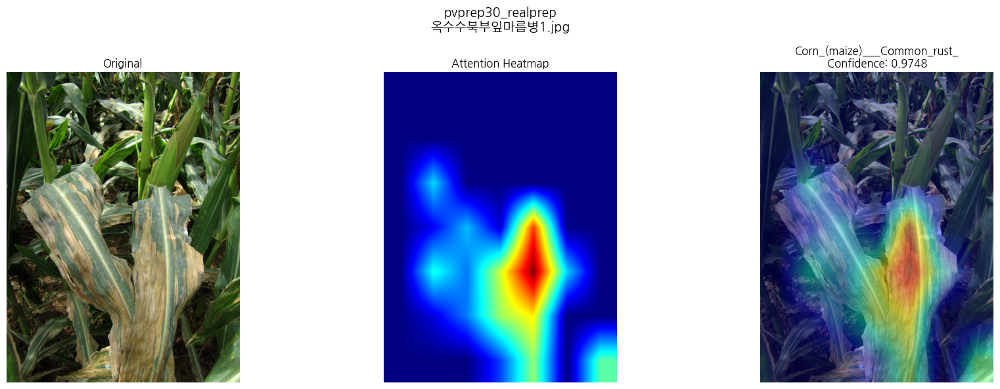

In [22]:
# ============================================================
# 비교 모델
# ============================================================

MODEL_PATHS = {

    "pvprep30":
    "/home/harry/Re_leaf_Project/cp_convnext_tiny_38realmix_pvprep30_finetuned.pth",

    "pvprep30_realprep":
    "/home/harry/Re_leaf_Project/cp_convnext_tiny_38realmix_pvprep30_realprep_finetuned.pth",
}


# ============================================================
# 테스트 이미지
# ============================================================

TEST_IMAGES = [

    # ========================================================
    # healthy 오진 체크
    # ========================================================

    "/home/harry/Re_leaf_Project/Test_image/토마토건강1.jpg",

    # ========================================================
    # late blight
    # ========================================================

    "/home/harry/Re_leaf_Project/Test_image/토마토전기역병1.jpg",

    # ========================================================
    # cedar rust
    # ========================================================

    "/home/harry/Re_leaf_Project/Test_image/사과삼나무사과녹병1.jpg",

    # ========================================================
    # corn
    # ========================================================

    "/home/harry/Re_leaf_Project/Test_image/옥수수북부잎마름병1.jpg",
]


# ============================================================
# class names 로드
# ============================================================

with open(CLASS_NAMES_PATH, "r", encoding="utf-8") as f:

    class_names = json.load(f)


# ============================================================
# transform
# ============================================================

transform = transforms.Compose([

    transforms.Resize((IMG_SIZE, IMG_SIZE)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================================
# 모델 생성 함수
# ============================================================

def create_model(model_path):

    model = models.convnext_tiny(weights=None)

    in_features = model.classifier[2].in_features

    model.classifier[2] = nn.Linear(
        in_features,
        NUM_CLASSES
    )

    state_dict = torch.load(
        model_path,
        map_location=DEVICE
    )

    model.load_state_dict(state_dict)

    model = model.to(DEVICE)

    model.eval()

    return model


# ============================================================
# Hook 함수
# ============================================================

activations = []
gradients = []


def forward_hook(module, input, output):

    activations.append(output)


def backward_hook(module, grad_input, grad_output):

    gradients.append(grad_output[0])


# ============================================================
# 테스트 시작
# ============================================================

for img_path in TEST_IMAGES:

    print("\n" + "=" * 100)
    print("IMAGE:", img_path)

    original_image = Image.open(img_path).convert("RGB")

    original_np = np.array(original_image)

    h, w, _ = original_np.shape

    input_tensor = transform(original_image).unsqueeze(0).to(DEVICE)

    # ========================================================
    # 모델별 비교
    # ========================================================

    for model_name, model_path in MODEL_PATHS.items():

        print("\nMODEL:", model_name)

        # ====================================================
        # activation / gradient 초기화
        # ====================================================

        activations.clear()
        gradients.clear()

        # ====================================================
        # 모델 로드
        # ====================================================

        model = create_model(model_path)

        target_layer = model.features[-1]

        # ====================================================
        # Hook 등록
        # ====================================================

        forward_handle = target_layer.register_forward_hook(
            forward_hook
        )

        backward_handle = target_layer.register_full_backward_hook(
            backward_hook
        )

        # ====================================================
        # Forward
        # ====================================================

        outputs = model(input_tensor)

        pred_idx = outputs.argmax(dim=1).item()

        pred_class = class_names[pred_idx]

        pred_conf = torch.softmax(
            outputs,
            dim=1
        )[0][pred_idx].item()

        print("Predicted :", pred_class)
        print("Confidence:", round(pred_conf, 4))

        # ====================================================
        # Backward
        # ====================================================

        model.zero_grad()

        outputs[0, pred_idx].backward()

        # ====================================================
        # activation / gradient 가져오기
        # ====================================================

        activation = activations[0].detach().cpu()[0]

        gradient = gradients[0].detach().cpu()[0]

        # ====================================================
        # channel 중요도 계산
        # ====================================================

        weights = gradient.mean(dim=(1, 2))

        # ====================================================
        # Grad-CAM 생성
        # ====================================================

        cam = torch.zeros(
            activation.shape[1:],
            dtype=torch.float32
        )

        for i, w_ in enumerate(weights):

            cam += w_ * activation[i]

        cam = torch.relu(cam)

        cam -= cam.min()

        cam /= cam.max()

        cam = cam.numpy()

        # ====================================================
        # resize
        # ====================================================

        cam_resized = cv2.resize(
            cam,
            (w, h)
        )

        # ====================================================
        # heatmap 생성
        # ====================================================

        heatmap = np.uint8(255 * cam_resized)

        heatmap = cv2.applyColorMap(
            heatmap,
            cv2.COLORMAP_JET
        )

        heatmap = cv2.cvtColor(
            heatmap,
            cv2.COLOR_BGR2RGB
        )

        # ====================================================
        # overlay 생성
        # ====================================================

        overlay = (
            heatmap * 0.4 +
            original_np * 0.6
        ).astype(np.uint8)

        # ====================================================
        # 시각화
        # ====================================================

        fig, axes = plt.subplots(
            1,
            3,
            figsize=(18, 6)
        )

        # ====================================================
        # 원본
        # ====================================================

        axes[0].imshow(original_np)

        axes[0].set_title("Original")

        axes[0].axis("off")

        # ====================================================
        # Heatmap
        # ====================================================

        axes[1].imshow(heatmap)

        axes[1].set_title("Attention Heatmap")

        axes[1].axis("off")

        # ====================================================
        # Overlay
        # ====================================================

        axes[2].imshow(overlay)

        axes[2].set_title(
            f"{pred_class}\nConfidence: {pred_conf:.4f}"
        )

        axes[2].axis("off")

        plt.suptitle(
            f"{model_name}\n{img_path.split('/')[-1]}",
            fontsize=14
        )

        plt.tight_layout()

        plt.show()

        # ====================================================
        # Hook 제거
        # ====================================================

        forward_handle.remove()

        backward_handle.remove()